# Installs

In [ ]:
!pip install -q dire-jax[utils]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 12.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.3/841.3 kB 58.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 4.0 MB/s eta 0:00:00


In [ ]:
#
# Benchmark-specific installs: may necessitate a restart as an older version of scipy is used by cyto packages
#
!pip install CytofDR
!pip install PyCytoData
!pip install umap-learn
#
# Installing Rapids.ai libraries for GPU-accelerated UMAP and tSNE: make sure the installation is finished and complete
#
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

fatal: destination path 'rapidsai-csp-utils' already exists and is not an empty directory.
Installing RAPIDS remaining 24.12.* libraries
Using Python 3.11.11 environment at: /usr/local
Resolved 167 packages in 1.54s
 Downloaded ucx-py-cu12
 Downloaded rmm-cu12
 Downloaded libkvikio-cu12
 Downloaded cucim-cu12
 Downloaded cuspatial-cu12
 Downloaded pylibraft-cu12
 Downloaded libcuspatial-cu12
 Downloaded nvidia-nvcomp-cu12
 Downloaded pynvjitlink-cu12
 Downloaded cudf-cu12
 Downloaded nvidia-nvjitlink-cu12
 Downloaded pylibcudf-cu12
 Downloaded nvidia-curand-cu12
 Downloaded nvidia-cufft-cu12
 Downloaded raft-dask-cu12
 Downloaded nvidia-cusparse-cu12
 Downloaded nvidia-cusolver-cu12
 Downloaded cuvs-cu12
 Downloaded libcudf-cu12
 Downloaded cuml-cu12
 Downloaded cugraph-cu12
 Downloaded nvidia-cublas-cu12
 Downloaded pylibcugraph-cu12
Prepared 33 packages in 50.49s
Uninstalled 1 package in 0.41ms
Installed 144 packages in 118ms
 + aiohappyeyeballs==2.4.8
 + aiohttp==3.11.13
 + aiosigna

# Imports

In [ ]:
#
# Imports
#
from dire_jax import *
from dire_jax.dire_utils import *
from jax import random
import numpy as np

In [ ]:
#
# Benchmark-specific imports: some implementations are expected to be missing, it is not an error
#
from umap import UMAP
from cuml import UMAP as cUMAP
from cuml import TSNE as cTSNE
from PyCytoData import DataLoader

No 'saucie' implementation.
No 'ZIFA' implementation.
No 'Grandprix' implementation.


In [ ]:
#
# Plotly settings: either interactive images or stills
#
import plotly.io as pio
#pio.renderers.default = 'colab' # interactive plots
pio.renderers.default = 'png'    # stills

In [ ]:
#
# Suppress non-essential warnings
#
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Benchmarking

## Dataset: "Blobs"

### DiRe reducer

In [ ]:
from sklearn.datasets import make_blobs
#
# Generate point blobs
#
n_samples  = 100_000
n_features = 1_000
n_centers  = 12
features_blobs, labels_blobs = make_blobs(n_samples=n_samples, n_features=n_features, centers=n_centers, random_state=42)
#

In [ ]:
reducer_blobs = DiRe(dimension=2,
                     n_neighbors=16,
                     init_embedding_type='pca',
                     max_iter_layout=32,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=4.0,
                     n_sample_dirs=8,
                     sample_size=16,
                     neg_ratio=32,
                     verbose=False,)

100%|██████████| 32/32 [00:05<00:00,  5.35it/s]


Embedding time: 13.8544 seconds


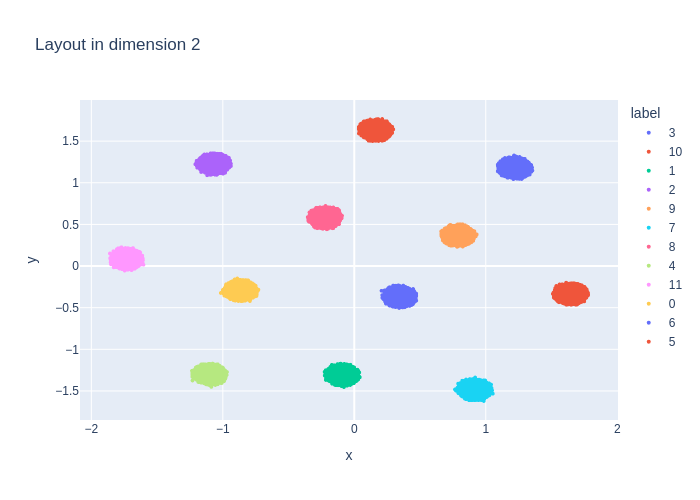

Computing persistence up to dimension 1 and global metrics
done


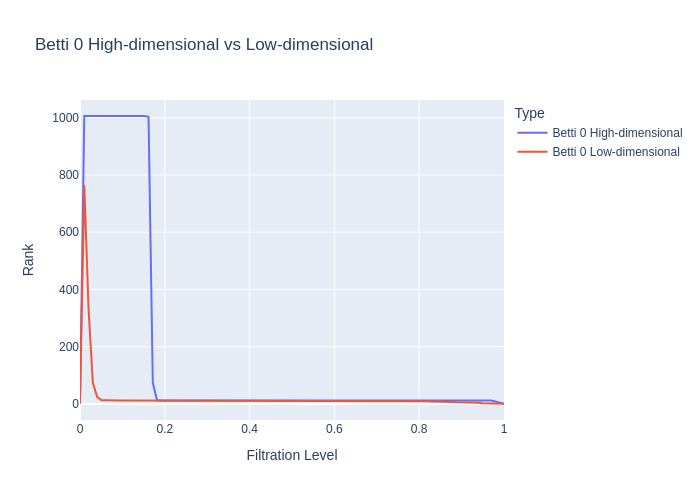

Distance `DTW` for dimension 0: 1.713474210365549
Distance `TWED` for dimension 0: 0.11162695930701744
Distance `EMD` for dimension 0: 0.022473912160561462
Distance `Wasserstein` for dimension 0: 3.2052925877836955
Distance `bottleneck` for dimension 0: 126.6282958984375


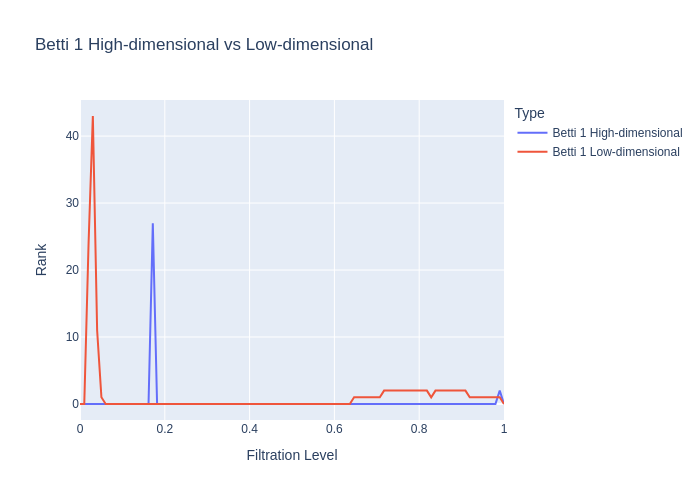

Distance `DTW` for dimension 1: 1.288356500161425
Distance `TWED` for dimension 1: 0.015247337304510871
Distance `EMD` for dimension 1: 0.026745147439706473
Distance `Wasserstein` for dimension 1: 0.021331053115136417
Distance `bottleneck` for dimension 1: 0.9532089233398438
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.0882922086927618
Neighborhood preservation score (mean, std): [0.0017375400057062507, 0.01051403395831585]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
viz_benchmark(reducer_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

### Defining benchmark dictionary

In [ ]:
benchmarks_blobs = {}

In [ ]:
benchmark = run_benchmark(reducer_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:02<00:00, 13.06it/s]


### CuML tSNE reducer

[W] [03:39:57.743333] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 11.4037 seconds


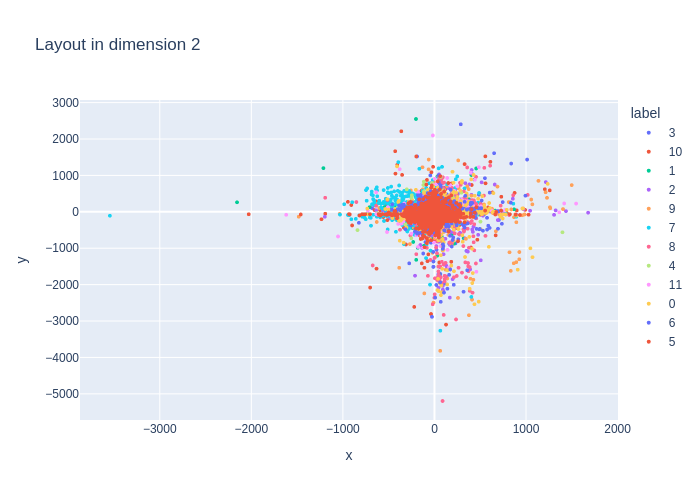

Computing persistence up to dimension 1 and global metrics
done


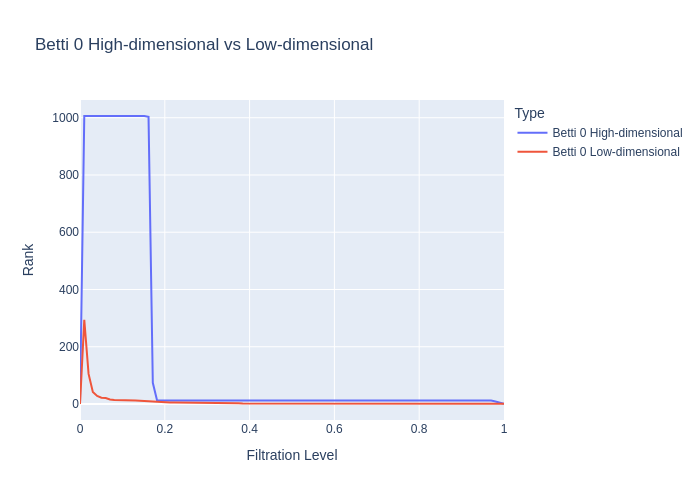

Distance `DTW` for dimension 0: 4.443241078704343
Distance `TWED` for dimension 0: 0.1752012320270109
Distance `EMD` for dimension 0: 0.2870459852055917
Distance `Wasserstein` for dimension 0: 3.1799275278122257
Distance `bottleneck` for dimension 0: 546.048828125


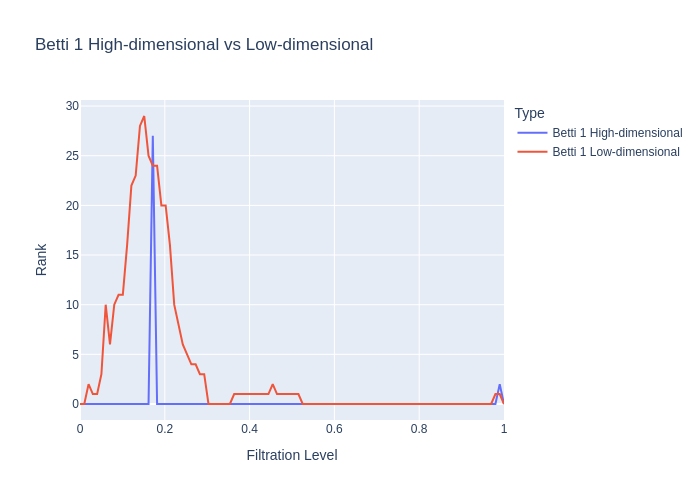

Distance `DTW` for dimension 1: 0.049693436965246814
Distance `TWED` for dimension 1: 0.018552402974708285
Distance `EMD` for dimension 1: 0.02674783828138319
Distance `Wasserstein` for dimension 1: 0.08042752714950253
Distance `bottleneck` for dimension 1: 18.99916172027588
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 23.420434344876956
Neighborhood preservation score (mean, std): [0.0005890107131563127, 0.004647165536880493]
Computing context measures
done
Context preservation score (SVM): [1.0, 0.2568653717347622, -1.3592031767318795]
Context preservation score (kNN): [1.0, 0.3532666666666667, -1.040532077591585]


In [ ]:
tred_blobs = cTSNE(n_components=2,
                   method='fft',
                   perplexity=reducer_blobs.n_neighbors,
                   n_neighbors=3*reducer_blobs.n_neighbors+1)
#
viz_benchmark(tred_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [ ]:
benchmark = run_benchmark(tred_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [03:42:46.247902] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 6.9042 seconds


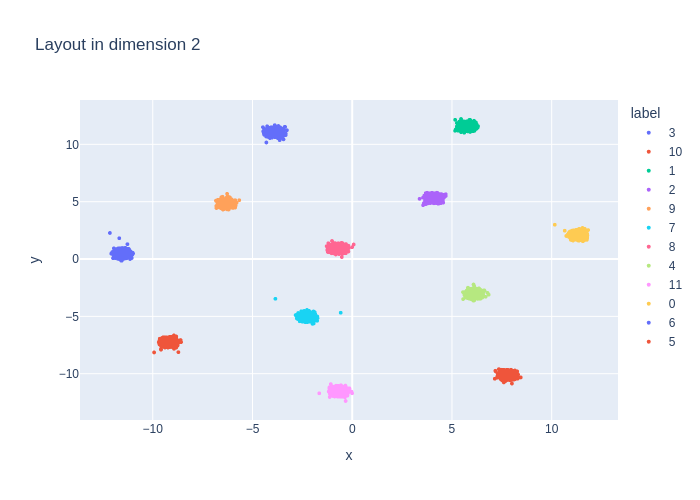

Computing persistence up to dimension 1 and global metrics
done


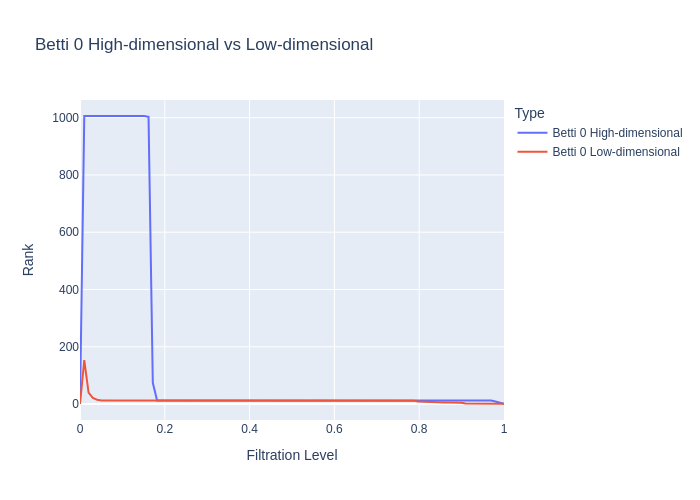

Distance `DTW` for dimension 0: 2.6703367693447246
Distance `TWED` for dimension 0: 0.18761691863130525
Distance `EMD` for dimension 0: 0.037654850751481825
Distance `Wasserstein` for dimension 0: 3.2115548534349223
Distance `bottleneck` for dimension 0: 126.6282958984375


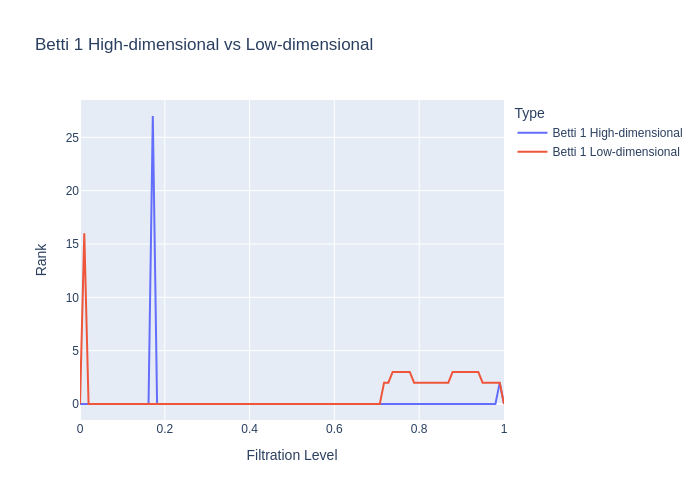

Distance `DTW` for dimension 1: 1.207341009553194
Distance `TWED` for dimension 1: 0.009951582292268514
Distance `EMD` for dimension 1: 0.014968866641761868
Distance `Wasserstein` for dimension 1: 0.021846340538034446
Distance `bottleneck` for dimension 1: 1.4266397953033447
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.180806137700151
Neighborhood preservation score (mean, std): [0.0004924823297187686, 0.005568338558077812]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
cured_blobs = cUMAP(n_components=reducer_blobs.dimension,
                    n_neighbors=reducer_blobs.n_neighbors,
                    min_dist=reducer_blobs.min_dist,
                    spread=reducer_blobs.spread)
#
viz_benchmark(cured_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [ ]:
benchmark = run_benchmark(cured_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 54.1929 seconds


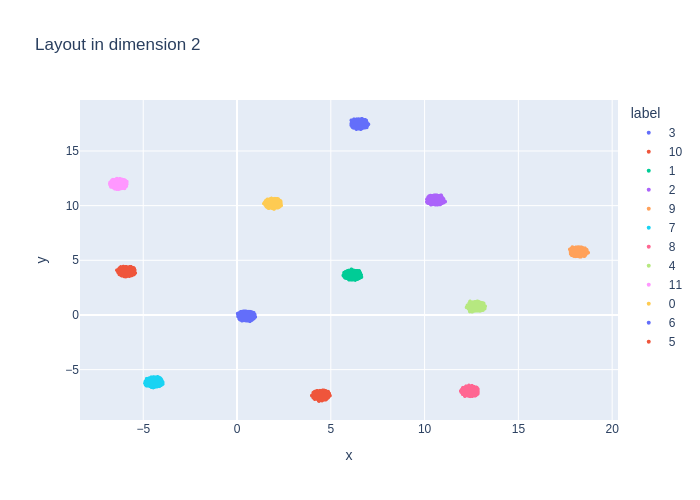

Computing persistence up to dimension 1 and global metrics
done


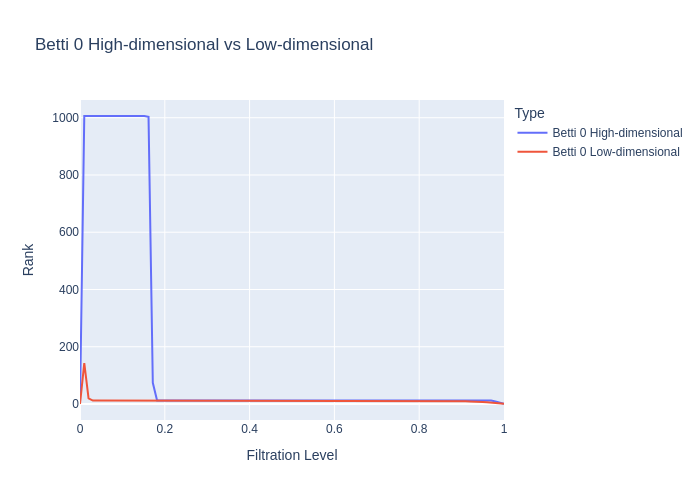

Distance `DTW` for dimension 0: 2.6853821052959423
Distance `TWED` for dimension 0: 0.1909089165101864
Distance `EMD` for dimension 0: 0.03524511367236659
Distance `Wasserstein` for dimension 0: 3.2120109955987846
Distance `bottleneck` for dimension 0: 126.6282958984375


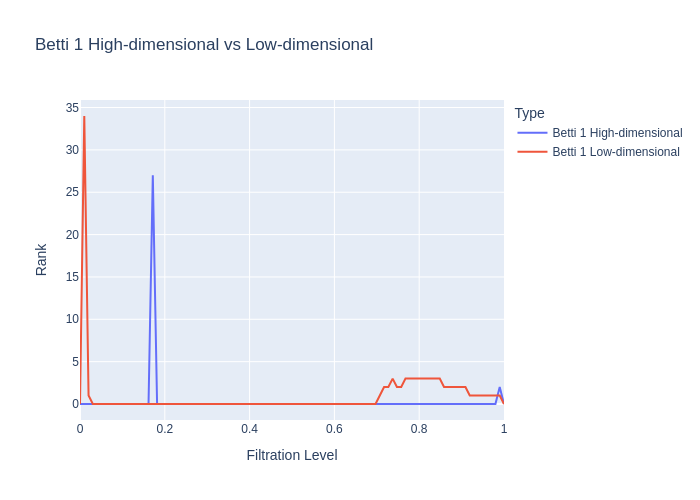

Distance `DTW` for dimension 1: 1.204111329058179
Distance `TWED` for dimension 1: 0.009747474523219266
Distance `EMD` for dimension 1: 0.017208188451909037
Distance `Wasserstein` for dimension 1: 0.02185762971918357
Distance `bottleneck` for dimension 1: 1.5974864959716797
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 6.434916480771355
Neighborhood preservation score (mean, std): [0.0005599797586910427, 0.005927372723817825]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
red_blobs = UMAP(n_components=reducer_blobs.dimension,
                 n_neighbors=reducer_blobs.n_neighbors,
                 min_dist=reducer_blobs.min_dist,
                 spread=reducer_blobs.spread)
#
viz_benchmark(red_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [ ]:
benchmark = run_benchmark(red_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Defining benchmark visualization procedure

In [ ]:
import matplotlib.pyplot as plt

def plot_algorithm_comparison(data):
    """
    Plots comparison graphs for different algorithms based on their performance metrics.

    Parameters:
        data (dict): A dictionary where keys are algorithm names and values are dictionaries of metrics and distance metrics.
    """

    algorithms = list(data.keys())

    # Extracting data from the input dictionary
    embedding_time = [data[alg]['Embedding time'] for alg in algorithms]
    embedding_stress = [data[alg]['Embedding stress'] for alg in algorithms]
    neighborhood_preservation = [data[alg]['Neighborhood preservation score'] for alg in algorithms]
    context_preservation_svm = [data[alg]['Context preservation score (SVM)'] for alg in algorithms]
    context_preservation_knn = [data[alg]['Context preservation score (kNN)'] for alg in algorithms]

    # Distance metrics for dimension 0 and dimension 1
    dtw_dim0 = [data[alg]['Distance DTW for dimension 0'] for alg in algorithms]
    twed_dim0 = [data[alg]['Distance TWED for dimension 0'] for alg in algorithms]
    emd_dim0 = [data[alg]['Distance EMD for dimension 0'] for alg in algorithms]
    wasserstein_dim0 = [data[alg]['Distance Wasserstein for dimension 0'] for alg in algorithms]
    bottleneck_dim0 = [data[alg]['Distance bottleneck for dimension 0'] for alg in algorithms]

    dtw_dim1 = [data[alg]['Distance DTW for dimension 1'] for alg in algorithms]
    twed_dim1 = [data[alg]['Distance TWED for dimension 1'] for alg in algorithms]
    emd_dim1 = [data[alg]['Distance EMD for dimension 1'] for alg in algorithms]
    wasserstein_dim1 = [data[alg]['Distance Wasserstein for dimension 1'] for alg in algorithms]
    bottleneck_dim1 = [data[alg]['Distance bottleneck for dimension 1'] for alg in algorithms]

    # Normalize for the distance metrics relative to the first algorithm (assumed as reference)
    dtw_dim0_norm = np.array(dtw_dim0) / dtw_dim0[0] #np.log(np.array(dtw_dim0) / dtw_dim0[0])
    twed_dim0_norm = np.array(twed_dim0) / twed_dim0[0] #np.log(np.array(twed_dim0) / twed_dim0[0])
    emd_dim0_norm = np.array(emd_dim0) / emd_dim0[0] #np.log(np.array(emd_dim0) / emd_dim0[0])
    wasserstein_dim0_norm = np.array(wasserstein_dim0) / wasserstein_dim0[0] #np.log(np.array(wasserstein_dim0) / wasserstein_dim0[0])
    bottleneck_dim0_norm = np.array(bottleneck_dim0) / bottleneck_dim0[0] #np.log(np.array(bottleneck_dim0) / bottleneck_dim0[0])

    dtw_dim1_norm = np.array(dtw_dim1) / dtw_dim1[0] #np.log(np.array(dtw_dim1) / dtw_dim1[0])
    twed_dim1_norm = np.array(twed_dim1) / twed_dim1[0] #np.log(np.array(twed_dim1) / twed_dim1[0])
    emd_dim1_norm = np.array(emd_dim1) / emd_dim1[0] #np.log(np.array(emd_dim1) / emd_dim1[0])
    wasserstein_dim1_norm = np.array(wasserstein_dim1) / wasserstein_dim1[0] #np.log(np.array(wasserstein_dim1) / wasserstein_dim1[0])
    bottleneck_dim1_norm = np.array(bottleneck_dim1) / bottleneck_dim1[0] #np.log(np.array(bottleneck_dim1) / bottleneck_dim1[0])

    # Plotting the graphs
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))

    # Embedding Time
    axs[0, 0].bar(algorithms, embedding_time, color='blue')
    axs[0, 0].set_title('Embedding Time (seconds)')
    axs[0, 0].set_ylabel('Time (s)')

    # Embedding Stress
    axs[0, 1].bar(algorithms, embedding_stress, color='green')
    axs[0, 1].set_title('Embedding Stress (Scaling Adjusted)')
    axs[0, 1].set_ylabel('Stress')

    # Neighborhood Preservation Score (Mean)
    axs[1, 0].bar(algorithms, neighborhood_preservation, color='orange')
    axs[1, 0].set_title('Neighborhood Preservation Score (Mean)')
    axs[1, 0].set_ylabel('Score')

    # Context Preservation Score (SVM and kNN)
    bar_width = 0.35
    index = np.arange(len(algorithms))

    axs[1, 1].bar(index, context_preservation_svm, bar_width, label='SVM', color='red')
    axs[1, 1].bar(index + bar_width, context_preservation_knn, bar_width, label='kNN', color='purple')
    axs[1, 1].set_title('Context Preservation Score (SVM and kNN)')
    axs[1, 1].set_ylabel('Score')
    axs[1, 1].set_xticks(index + bar_width / 2)
    axs[1, 1].set_xticklabels(algorithms)
    axs[1, 1].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 0
    axs[2, 0].plot(algorithms, dtw_dim0_norm, marker='o', label='DTW', color='blue')
    axs[2, 0].plot(algorithms, twed_dim0_norm, marker='o', label='TWED', color='green')
    axs[2, 0].plot(algorithms, emd_dim0_norm, marker='o', label='EMD', color='orange')
    axs[2, 0].plot(algorithms, wasserstein_dim0_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 0].plot(algorithms, bottleneck_dim0_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 0].set_title('Normalized Distance Metrics for Dimension 0')
    axs[2, 0].set_ylabel('Distance Ratio')
    axs[2, 0].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 1
    axs[2, 1].plot(algorithms, dtw_dim1_norm, marker='o', label='DTW', color='blue')
    axs[2, 1].plot(algorithms, twed_dim1_norm, marker='o', label='TWED', color='green')
    axs[2, 1].plot(algorithms, emd_dim1_norm, marker='o', label='EMD', color='orange')
    axs[2, 1].plot(algorithms, wasserstein_dim1_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 1].plot(algorithms, bottleneck_dim1_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 1].set_title('Normalized Distance Metrics for Dimension 1')
    axs[2, 1].set_ylabel('Distance Ratio')
    axs[2, 1].legend()

    plt.tight_layout()
    plt.show()

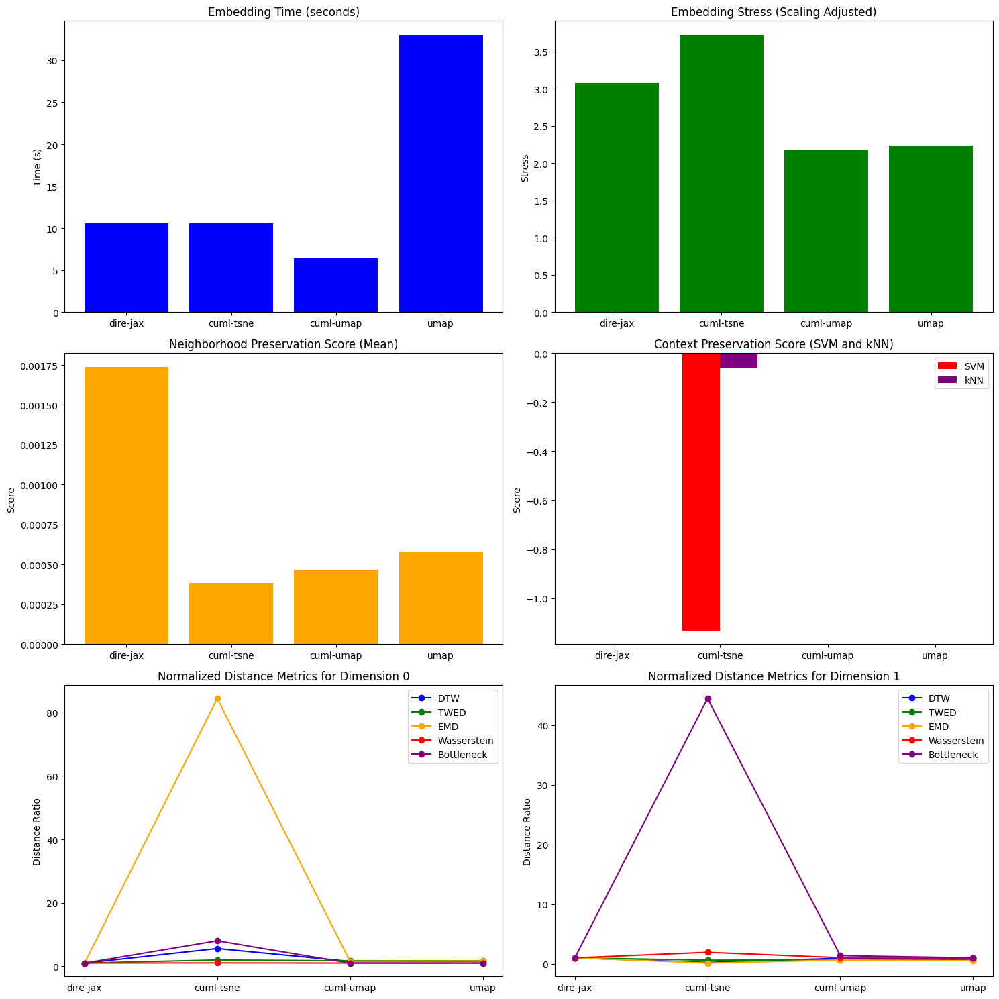

In [ ]:
#
# Plot the benchmarking results
#
plot_algorithm_comparison(benchmarks_blobs)

## Dataset "MNIST Digits"

In [ ]:
from sklearn.datasets import fetch_openml
# Loading the full MNIST dataset
mnist = fetch_openml('mnist_784', version=1, parser='auto')
#
features_mnist = np.array(mnist['data'], dtype=np.float32)
labels_mnist = np.array(mnist['target'], dtype=np.int32)
#
features_mnist = features_mnist / 255.0 - 0.5

### DiRe reducer

In [ ]:
reducer_mnist = DiRe(dimension=2,
                     n_neighbors=32,
                     init_embedding_type='spectral',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=4,
                     sample_size=32,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:10<00:00, 12.67it/s]


Embedding time: 20.7054 seconds


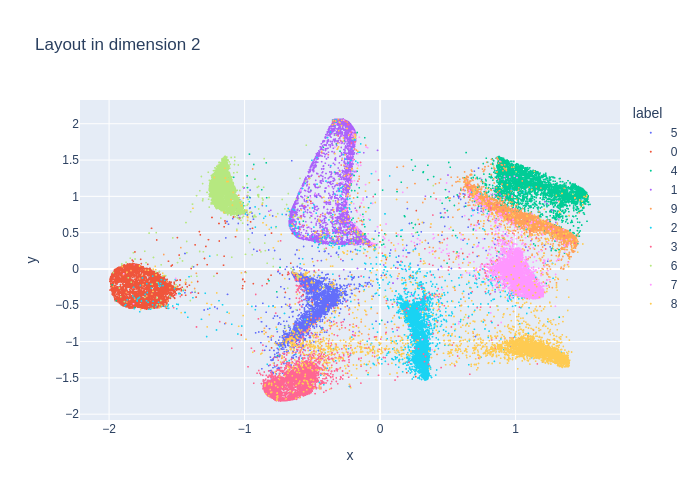

Computing persistence up to dimension 1 and global metrics
done


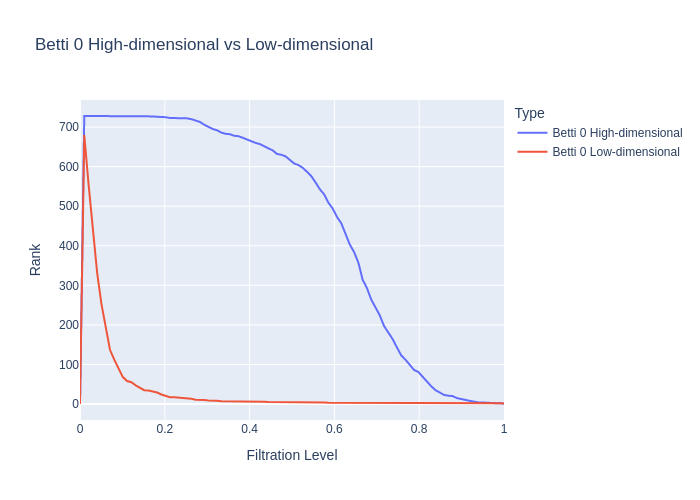

Distance `DTW` for dimension 0: 0.46567687567189764
Distance `TWED` for dimension 0: 0.16339425043948103
Distance `EMD` for dimension 0: 0.00547856031606945
Distance `Wasserstein` for dimension 0: 0.43398940300300154
Distance `bottleneck` for dimension 0: 4.639749050140381


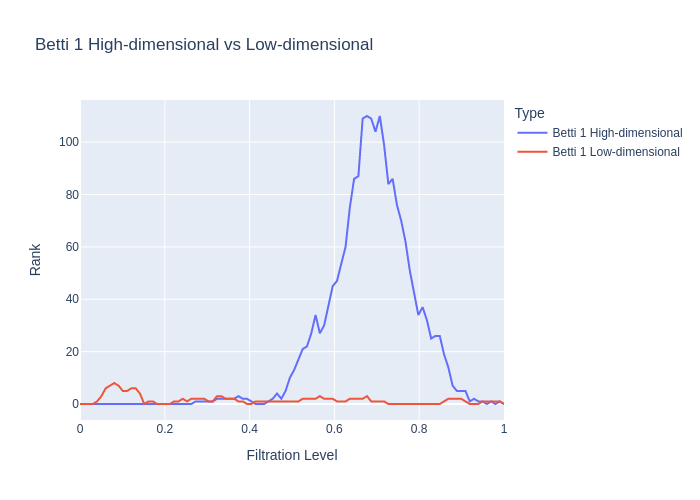

Distance `DTW` for dimension 1: 0.3277810575778701
Distance `TWED` for dimension 1: 0.05772850868839458
Distance `EMD` for dimension 1: 0.013863485577048784
Distance `Wasserstein` for dimension 1: 0.02295263227014047
Distance `bottleneck` for dimension 1: 0.7777338027954102
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.84953916769785
Neighborhood preservation score (mean, std): [0.029366610571742058, 0.04155370220541954]
Computing context measures
done
Context preservation score (SVM): [0.846336822074215, 0.7992388201712655, -0.05725761526853056]
Context preservation score (kNN): [0.923, 0.9425238095238095, 0.020931946594459943]


In [ ]:
viz_benchmark(reducer_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_mnist = {}

In [ ]:
benchmark = run_benchmark(reducer_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:05<00:00, 22.17it/s]


### CuML tSNE reducer

[W] [00:22:24.572676] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 4.3761 seconds


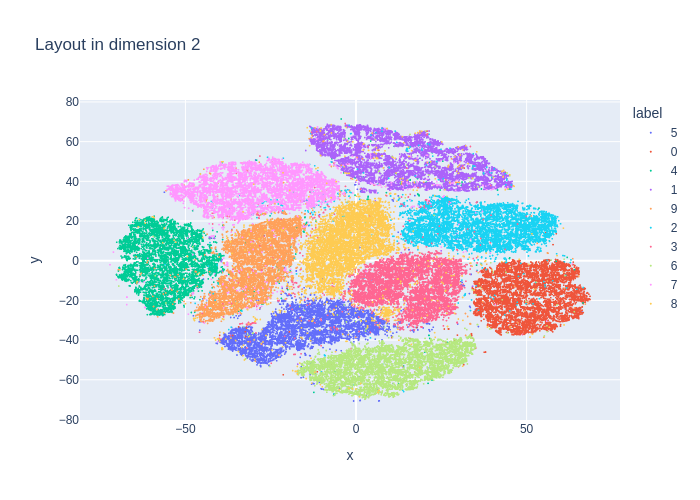

Computing persistence up to dimension 1 and global metrics
done


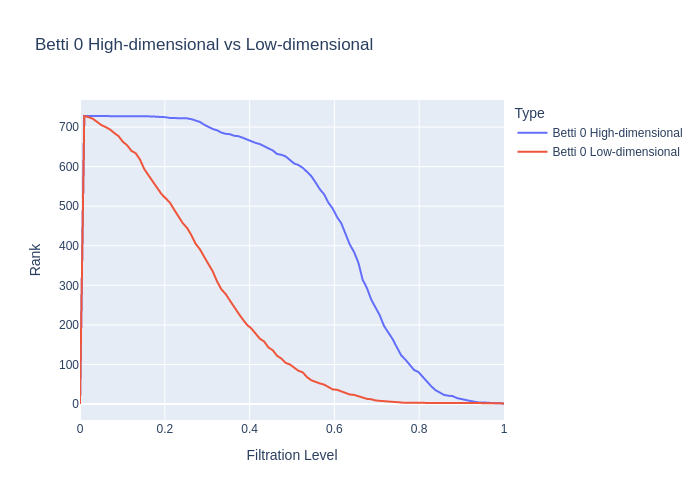

Distance `DTW` for dimension 0: 0.07188181903249005
Distance `TWED` for dimension 0: 0.08714279619235438
Distance `EMD` for dimension 0: 0.0004285611597068583
Distance `Wasserstein` for dimension 0: 0.3281483005520006
Distance `bottleneck` for dimension 0: 3.3428003787994385


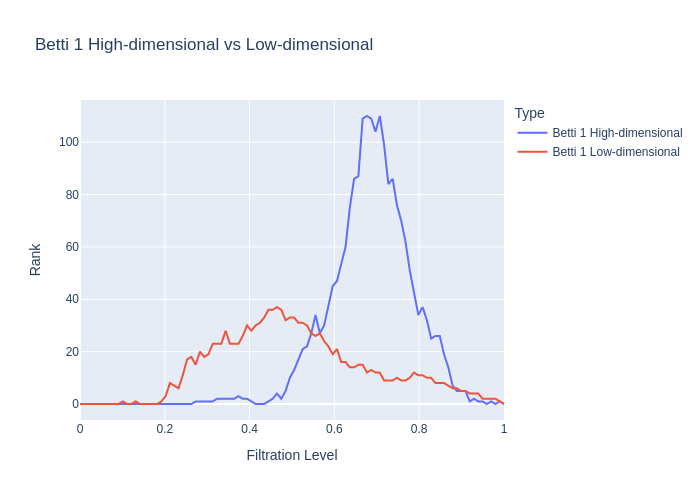

Distance `DTW` for dimension 1: 0.15297239114321315
Distance `TWED` for dimension 1: 0.057411773350496145
Distance `EMD` for dimension 1: 0.0003074036321128597
Distance `Wasserstein` for dimension 1: 0.031028081819183873
Distance `bottleneck` for dimension 1: 4.04735255241394
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.3798788921928278
Neighborhood preservation score (mean, std): [0.06615316867828369, 0.06809982657432556]
Computing context measures
done
Context preservation score (SVM): [0.846336822074215, 0.8539486203615604, -0.008953613256544103]
Context preservation score (kNN): [0.9241904761904762, 0.9614761904761905, 0.03955160836654278]


In [ ]:
tred_mnist = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [00:23:58.704890] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 3.8889 seconds


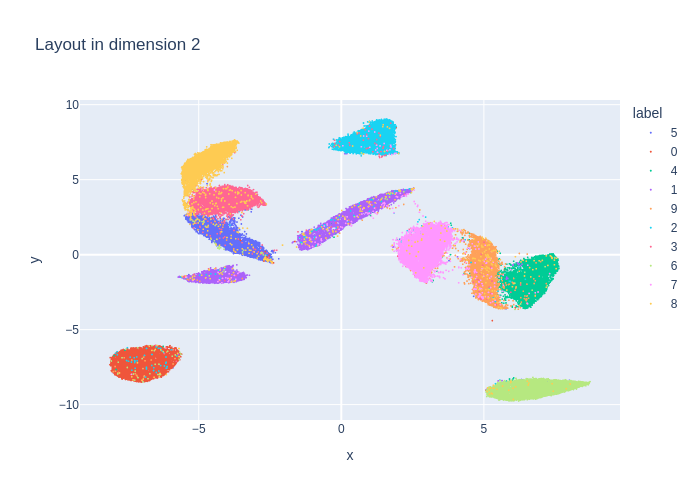

Computing persistence up to dimension 1 and global metrics
done


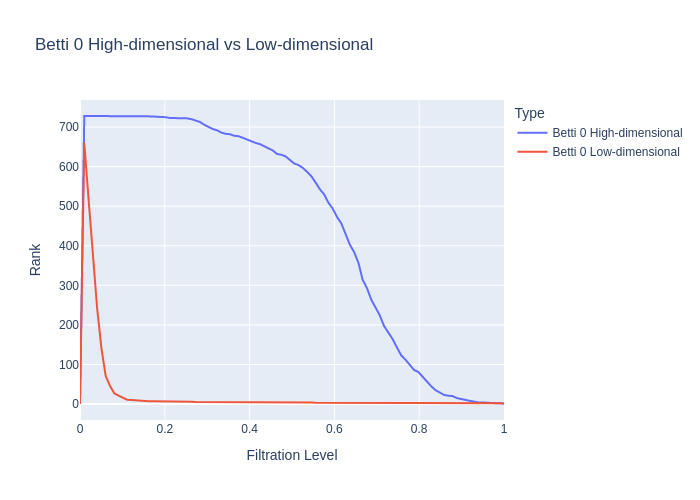

Distance `DTW` for dimension 0: 0.5635828719481226
Distance `TWED` for dimension 0: 0.17993477778323103
Distance `EMD` for dimension 0: 0.006957735378226142
Distance `Wasserstein` for dimension 0: 0.4410201985963071
Distance `bottleneck` for dimension 0: 4.481546878814697


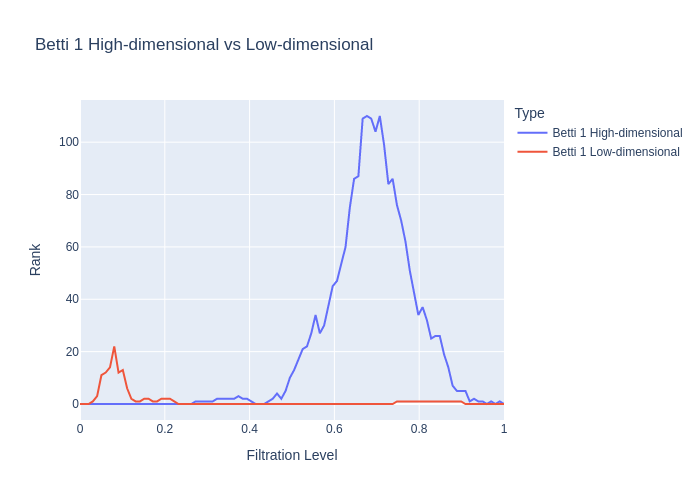

Distance `DTW` for dimension 1: 0.3152892912681128
Distance `TWED` for dimension 1: 0.06028574143458203
Distance `EMD` for dimension 1: 0.015108246700010125
Distance `Wasserstein` for dimension 1: 0.023392059622564965
Distance `bottleneck` for dimension 1: 0.7777338027954102
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.223220812693059
Neighborhood preservation score (mean, std): [0.023542353883385658, 0.03494569659233093]
Computing context measures
done
Context preservation score (SVM): [0.846336822074215, 0.7064700285442436, -0.18063663642903513]
Context preservation score (kNN): [0.923, 0.9645714285714285, 0.04405465271762755]


In [ ]:
cured_mnist = cUMAP(n_components=reducer_mnist.dimension,
                    n_neighbors=reducer_mnist.n_neighbors,
                    min_dist=reducer_mnist.min_dist,
                    spread=reducer_mnist.spread)
#
viz_benchmark(cured_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 38.4650 seconds


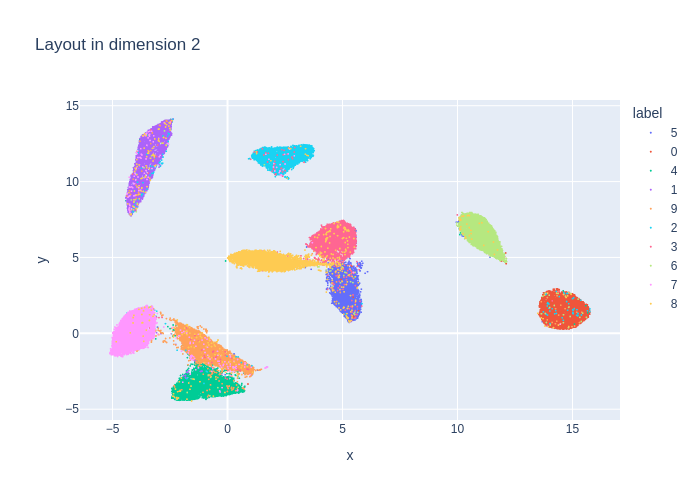

Computing persistence up to dimension 1 and global metrics
done


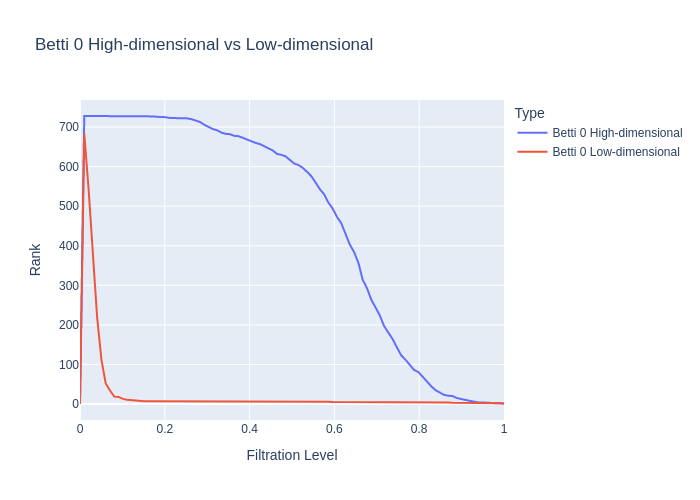

Distance `DTW` for dimension 0: 0.4878578861429597
Distance `TWED` for dimension 0: 0.18678446649347694
Distance `EMD` for dimension 0: 0.006515349581442551
Distance `Wasserstein` for dimension 0: 0.44026748036784374
Distance `bottleneck` for dimension 0: 4.460675239562988


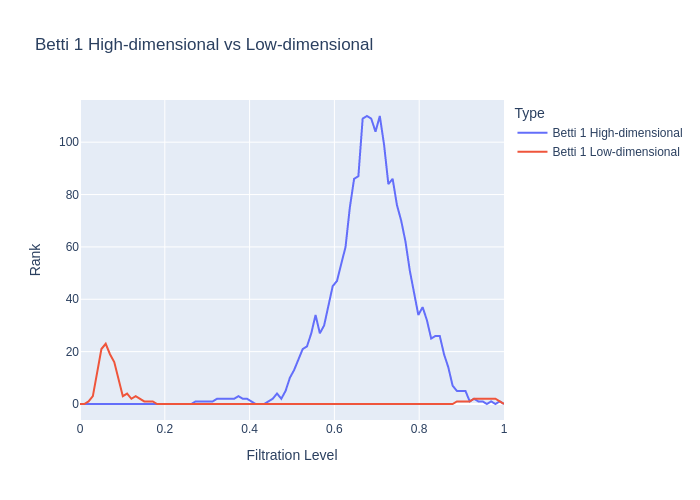

Distance `DTW` for dimension 1: 0.30908274934924573
Distance `TWED` for dimension 1: 0.060573680274218306
Distance `EMD` for dimension 1: 0.013595519425596888
Distance `Wasserstein` for dimension 1: 0.02339747824497427
Distance `bottleneck` for dimension 1: 0.7777338027954102
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.9035170636292205
Neighborhood preservation score (mean, std): [0.025318853557109833, 0.03657502308487892]
Computing context measures
done
Context preservation score (SVM): [0.846336822074215, 0.9100856327307326, -0.07262128177441779]
Context preservation score (kNN): [0.923, 0.9661904761904762, 0.04573176059358518]


In [ ]:
red_mnist = UMAP(n_components=reducer_mnist.dimension,
                 n_neighbors=reducer_mnist.n_neighbors,
                 min_dist=reducer_mnist.min_dist,
                 spread=reducer_mnist.spread)
#
viz_benchmark(red_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

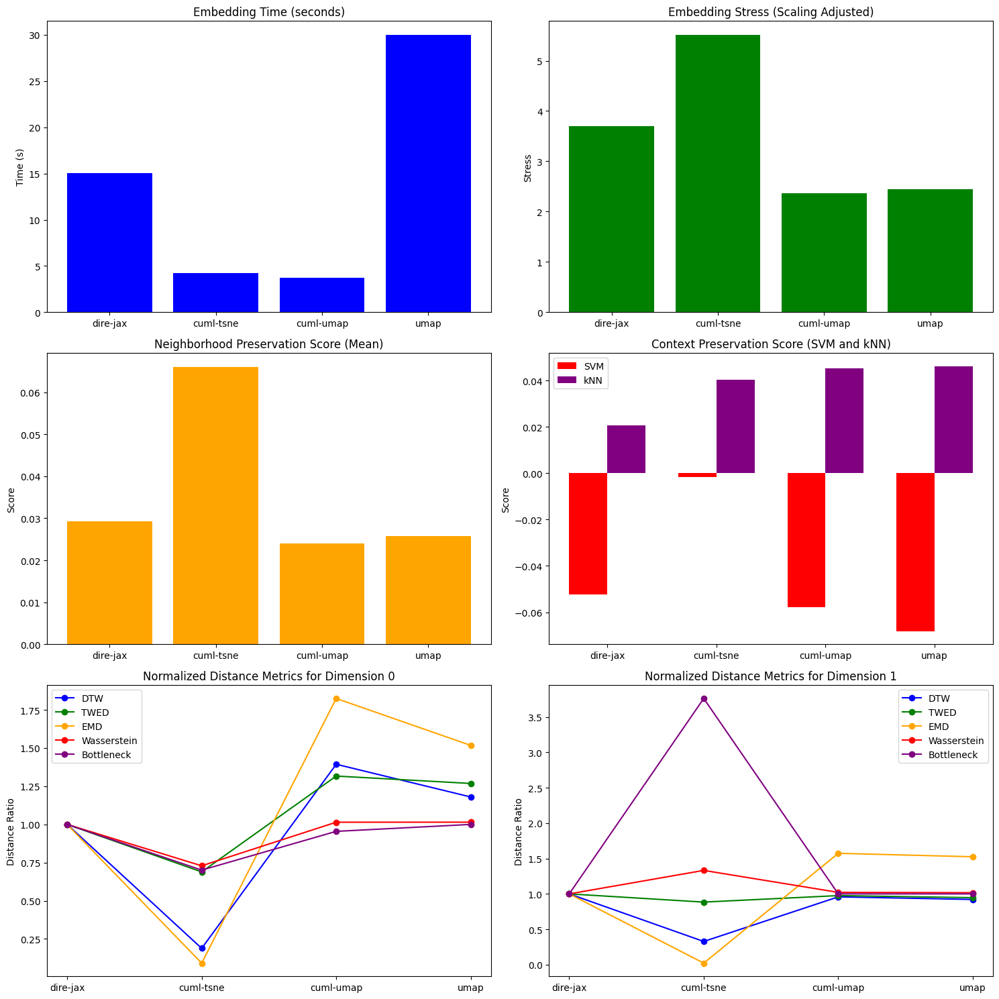

In [ ]:
plot_algorithm_comparison(benchmarks_mnist)

## Dataset "Forest Cover Types"

In [ ]:
from sklearn.datasets import fetch_covtype
#
features_covtype, labels_covtype = fetch_covtype(return_X_y=True)
features_covtype, labels_covtype = features_covtype[::5], labels_covtype[::5]

### DiRe reducer

In [ ]:
reducer_covtype  = DiRe(dimension=3,
                        n_neighbors=32,
                        init_embedding_type='pca',
                        max_iter_layout=64,
                        min_dist=1e-1,
                        spread=1.0,
                        cutoff=16.0,
                        n_sample_dirs=8,
                        sample_size=8,
                        neg_ratio=8,
                        verbose=False)

100%|██████████| 64/64 [00:06<00:00,  9.74it/s]


Embedding time: 9.0068 seconds


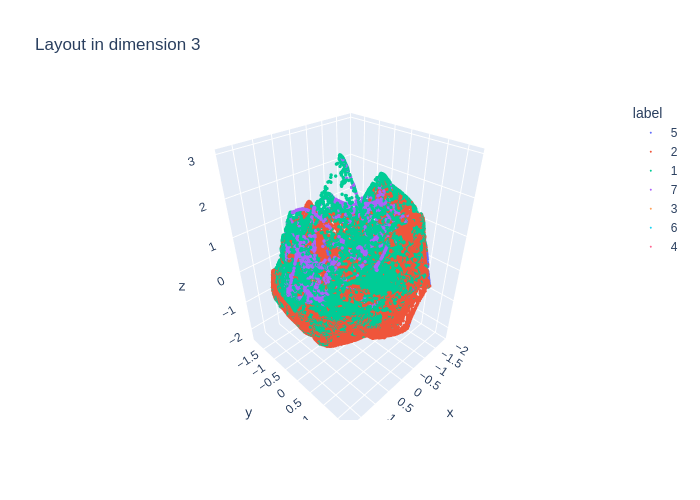

Computing persistence up to dimension 1 and global metrics
done


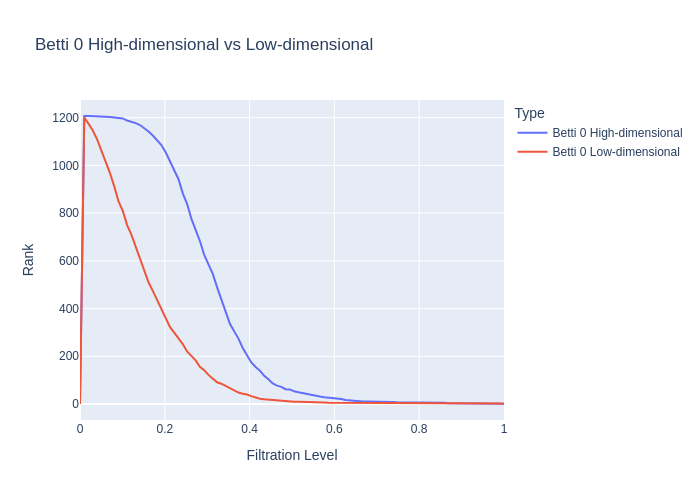

Distance `DTW` for dimension 0: 4.077305271965838
Distance `TWED` for dimension 0: 0.09422131113406183
Distance `EMD` for dimension 0: 0.024905059169838036
Distance `Wasserstein` for dimension 0: 19.210291646385915
Distance `bottleneck` for dimension 0: 427.1167907714844


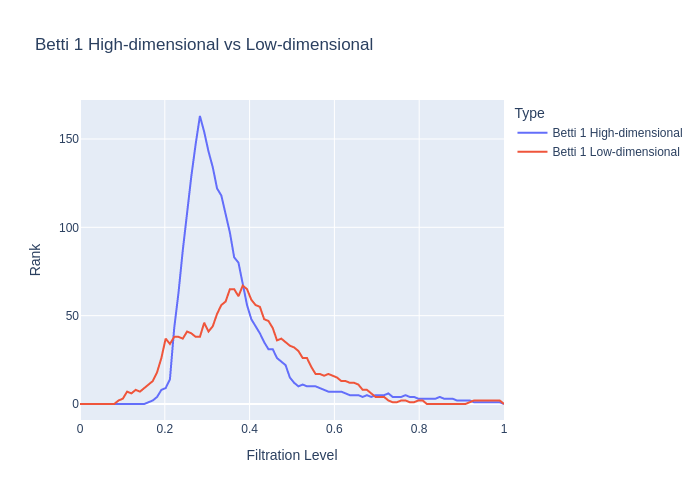

Distance `DTW` for dimension 1: 5.315483329228655
Distance `TWED` for dimension 1: 0.04542305562033582
Distance `EMD` for dimension 1: 0.049891491345596235
Distance `Wasserstein` for dimension 1: 1.8880784431870026
Distance `bottleneck` for dimension 1: 162.96160888671875
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.378542099660364
Neighborhood preservation score (mean, std): [0.051383454352617264, 0.07810474932193756]
Computing context measures
done
Context preservation score (SVM): [0.7202956225127913, 0.571915861284821, -0.23066982966145438]
Context preservation score (kNN): [0.8037922033217636, 0.7295258311580276, -0.09694600545724832]


In [ ]:
viz_benchmark(reducer_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_covtype = {}

In [ ]:
benchmark = run_benchmark(reducer_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:02<00:00, 26.09it/s]


### CuML tSNE reducer

[W] [00:37:32.542693] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 4.5650 seconds


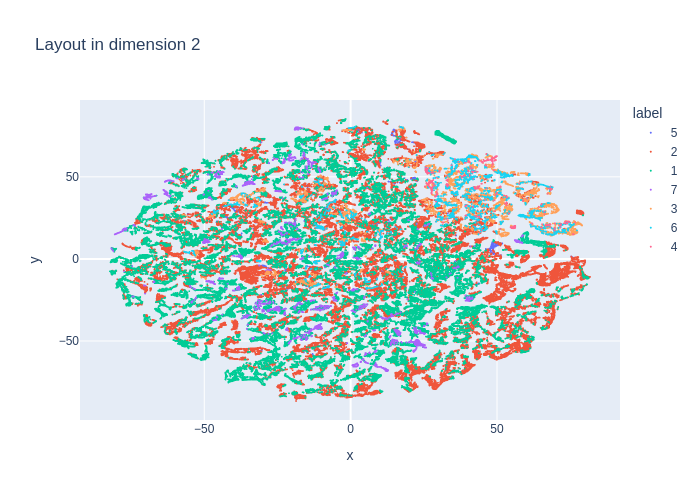

Computing persistence up to dimension 1 and global metrics
done


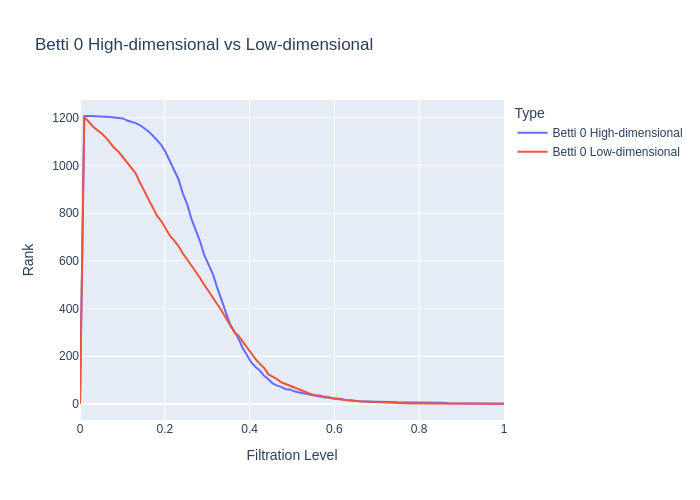

Distance `DTW` for dimension 0: 3.778209162881549
Distance `TWED` for dimension 0: 0.09592709929704157
Distance `EMD` for dimension 0: 0.015040348074803363
Distance `Wasserstein` for dimension 0: 19.39236296921761
Distance `bottleneck` for dimension 0: 427.1167907714844


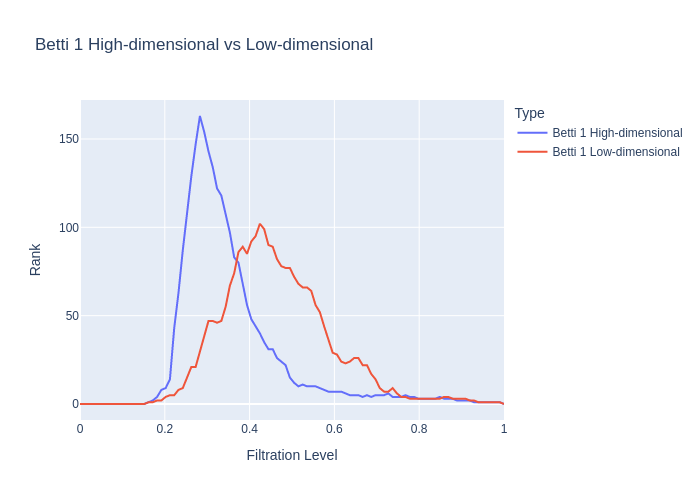

Distance `DTW` for dimension 1: 5.235309835178062
Distance `TWED` for dimension 1: 0.04080634859325027
Distance `EMD` for dimension 1: 0.038173814676976774
Distance `Wasserstein` for dimension 1: 1.9110669853458673
Distance `bottleneck` for dimension 1: 162.96160888671875
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.299063551202746
Neighborhood preservation score (mean, std): [0.09143602102994919, 0.12461498379707336]
Computing context measures
done
Context preservation score (SVM): [0.7202956225127913, 0.49204093234792495, -0.3810998057048751]
Context preservation score (kNN): [0.8064312555577866, 0.7782048707724964, -0.03562883638334352]


In [ ]:
tred_covtype = cTSNE(n_components=2,
                     method='fft',
                     perplexity=25,
                     n_neighbors=3*25+1)
#
viz_benchmark(tred_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [00:39:40.830080] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 4.0470 seconds


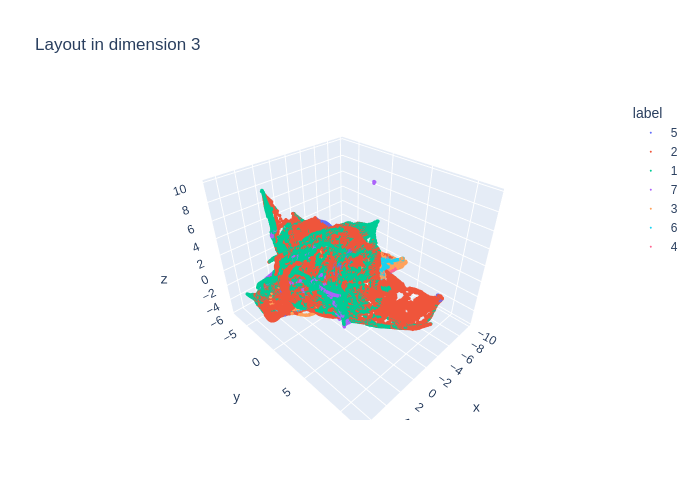

Computing persistence up to dimension 1 and global metrics
done


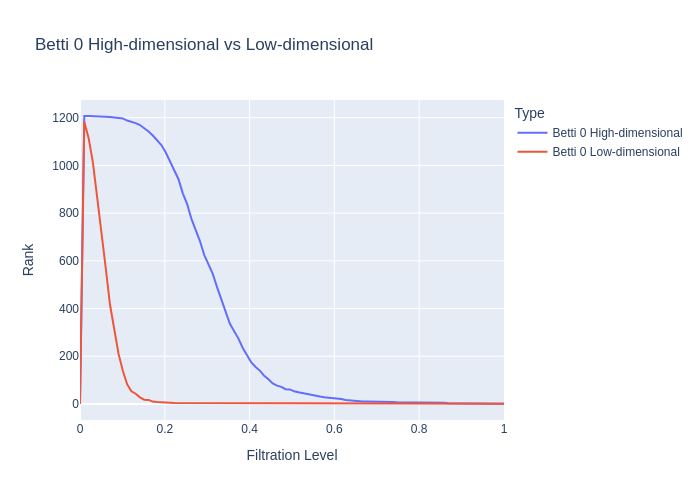

Distance `DTW` for dimension 0: 4.469441304875938
Distance `TWED` for dimension 0: 0.14084716276319295
Distance `EMD` for dimension 0: 0.06700325152896466
Distance `Wasserstein` for dimension 0: 19.233424925402996
Distance `bottleneck` for dimension 0: 427.1167907714844


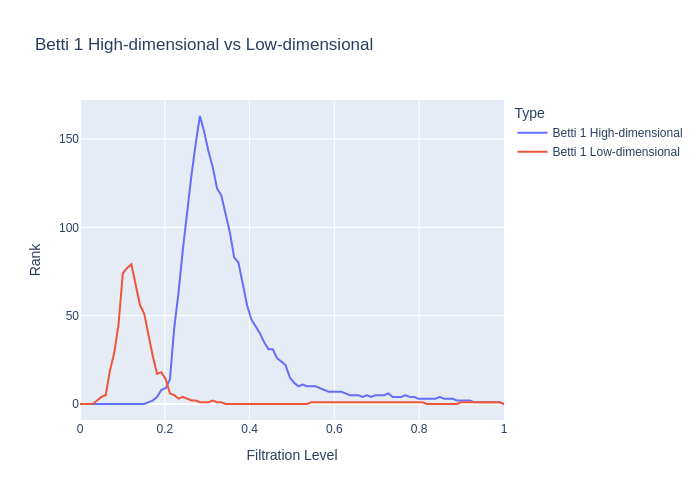

Distance `DTW` for dimension 1: 5.307694654573679
Distance `TWED` for dimension 1: 0.04193321374433635
Distance `EMD` for dimension 1: 0.13493665861400886
Distance `Wasserstein` for dimension 1: 1.890507416530572
Distance `bottleneck` for dimension 1: 162.96160888671875
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.1524174618026297
Neighborhood preservation score (mean, std): [0.054380714893341064, 0.08289920538663864]
Computing context measures
done
Context preservation score (SVM): [0.7202956225127913, 0.5346787947697555, -0.29799553158005393]
Context preservation score (kNN): [0.8037922033217636, 0.7303003356185995, -0.09588491400558466]


In [ ]:
cured_covtype = cUMAP(n_components=reducer_covtype.dimension,
                      n_neighbors=reducer_covtype.n_neighbors,
                      min_dist=reducer_covtype.min_dist,
                      spread=reducer_covtype.spread)
#
viz_benchmark(cured_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 55.2614 seconds


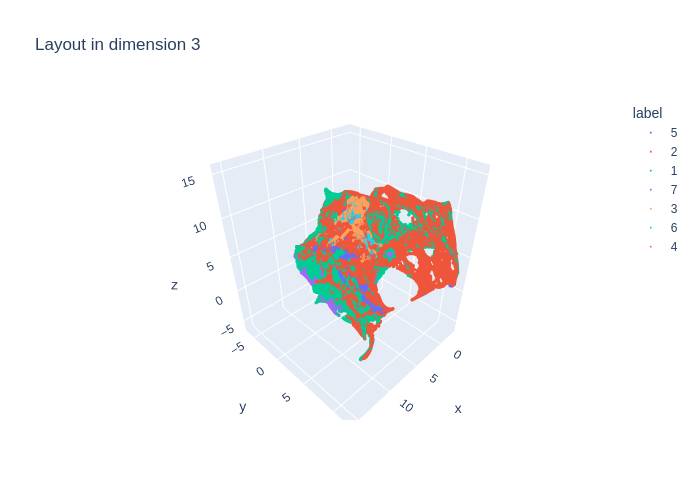

Computing persistence up to dimension 1 and global metrics
done


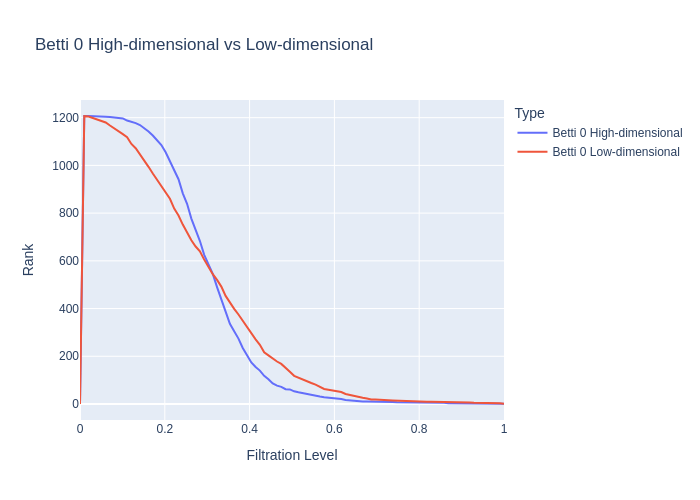

Distance `DTW` for dimension 0: 3.7302923327975135
Distance `TWED` for dimension 0: 0.09730904975679637
Distance `EMD` for dimension 0: 0.012927007909307741
Distance `Wasserstein` for dimension 0: 19.23560433195477
Distance `bottleneck` for dimension 0: 427.1167907714844


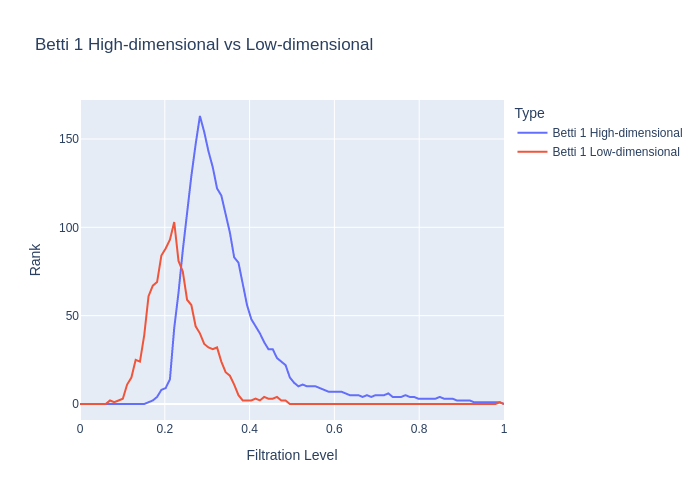

Distance `DTW` for dimension 1: 5.309373405067224
Distance `TWED` for dimension 1: 0.038737602965918175
Distance `EMD` for dimension 1: 0.07328120448749788
Distance `Wasserstein` for dimension 1: 1.89079665604444
Distance `bottleneck` for dimension 1: 162.96160888671875
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.9118222601511217
Neighborhood preservation score (mean, std): [0.06162114441394806, 0.0908999890089035]
Computing context measures
done
Context preservation score (SVM): [0.7202956225127913, 0.5204661739624786, -0.3249368162065737]
Context preservation score (kNN): [0.8037922033217636, 0.7456756834284731, -0.07505001723007075]


In [ ]:
red_covtype = UMAP(n_components=reducer_covtype.dimension,
                   n_neighbors=reducer_covtype.n_neighbors,
                   min_dist=reducer_covtype.min_dist,
                   spread=reducer_covtype.spread)
#
viz_benchmark(red_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

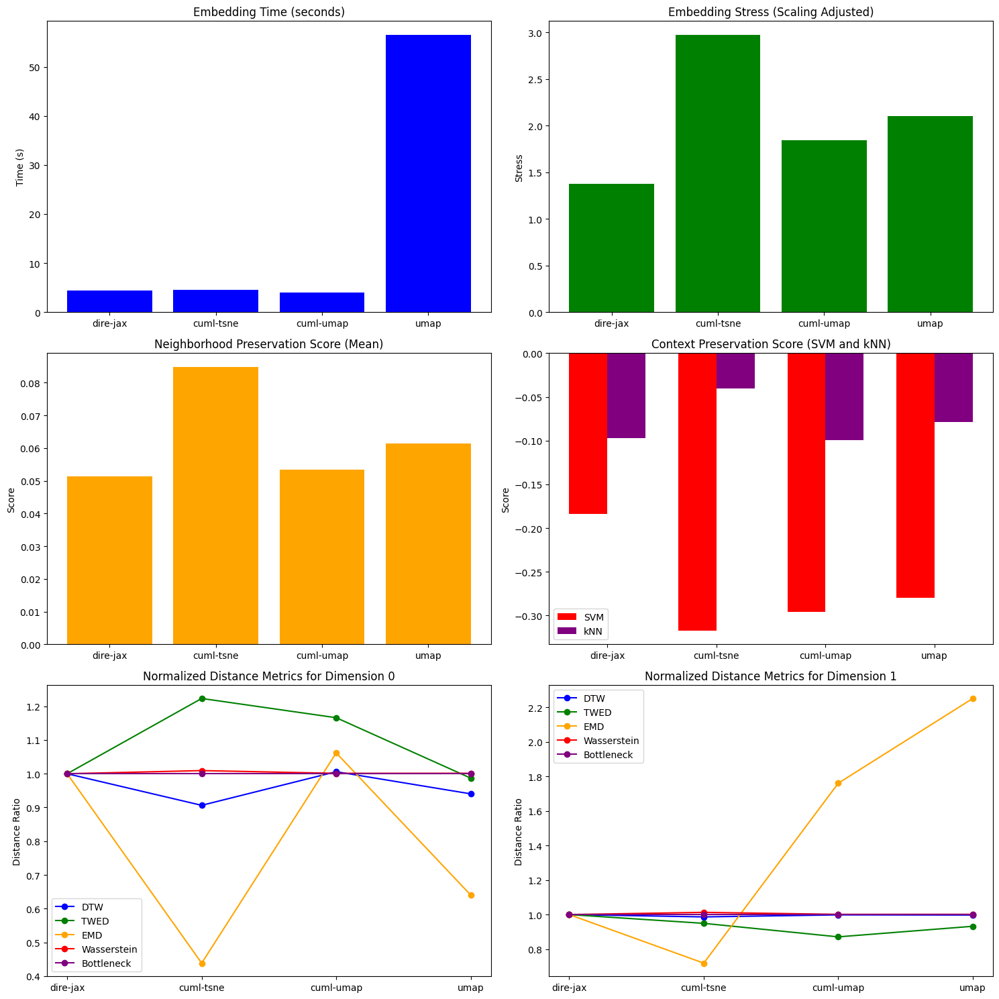

In [ ]:
plot_algorithm_comparison(benchmarks_covtype)

## Dataset "Disk Uniform"

In [ ]:
def rand_point_disk(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  rads = np.sqrt(np.random.rand(num)).reshape(-1, 1)
  pts = prepts * rads/prenorms
  return pts

In [ ]:
features_disk, labels_disk = rand_point_disk(2, 10000), None

### DiRe reducer

In [ ]:
reducer_disk = DiRe(dimension=2,
                    n_neighbors=64,
                    init_embedding_type='pca',
                    max_iter_layout=16,
                    min_dist=1e-4,
                    spread=1.0,
                    cutoff=1.0,
                    n_sample_dirs=8,
                    sample_size=32,
                    neg_ratio=8,
                    verbose=False,)

100%|██████████| 16/16 [00:03<00:00,  4.17it/s]


Embedding time: 5.0845 seconds


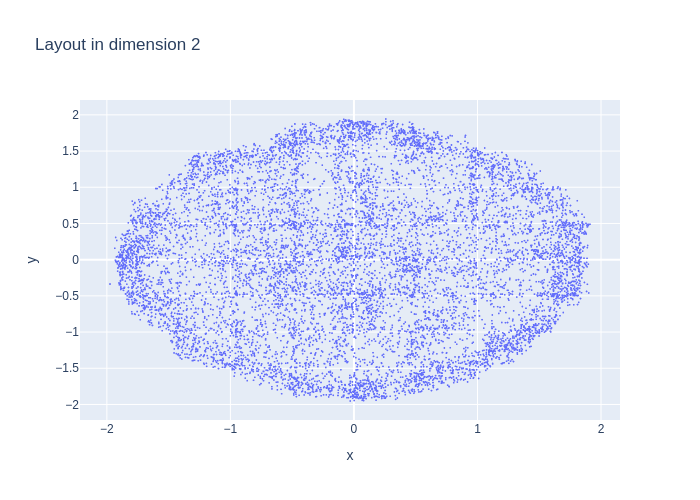

Computing persistence up to dimension 1 and global metrics
done


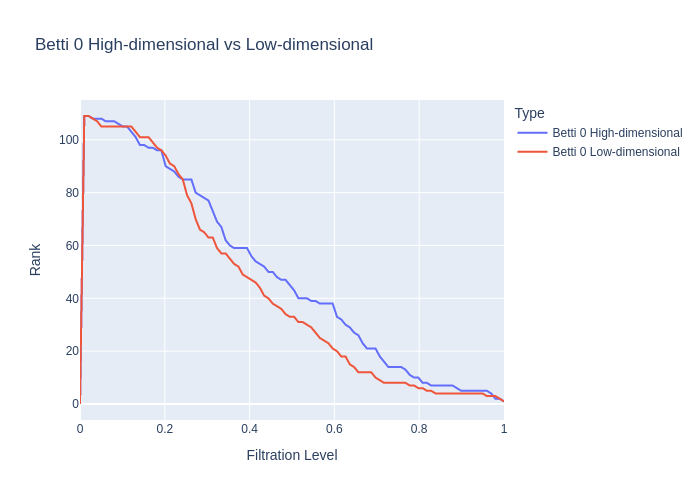

Distance `DTW` for dimension 0: 0.06075566328105784
Distance `TWED` for dimension 0: 0.14245869817357437
Distance `EMD` for dimension 0: 7.469294307366949e-05
Distance `Wasserstein` for dimension 0: 0.009923583710987878
Distance `bottleneck` for dimension 0: 0.2673681974411011


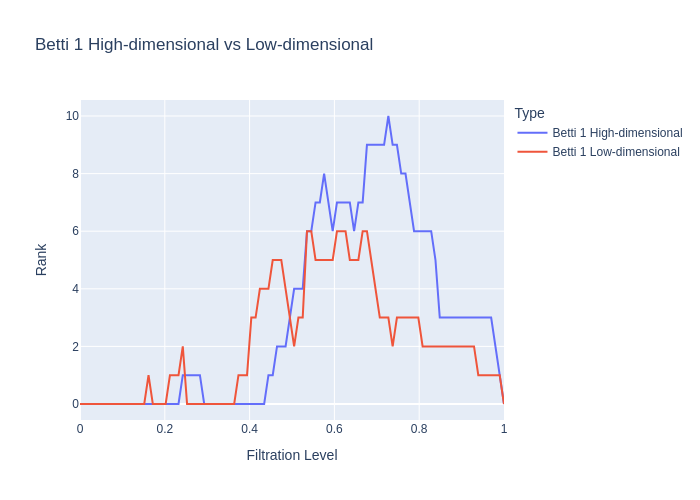

Distance `DTW` for dimension 1: 0.0836870980174737
Distance `TWED` for dimension 1: 0.09434784640476496
Distance `EMD` for dimension 1: 0.0004703190718907868
Distance `Wasserstein` for dimension 1: 0.002283221030074438
Distance `bottleneck` for dimension 1: 0.186099112033844
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.473186970683237
Neighborhood preservation score (mean, std): [0.06514053791761398, 0.05199157074093819]
Data has no labels: no context analysis performed


In [ ]:
viz_benchmark(reducer_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_disk = {}

In [ ]:
benchmark = run_benchmark(reducer_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 16/16 [00:00<00:00, 38.74it/s]


### CuML tSNE reducer

Embedding time: 1.1306 seconds


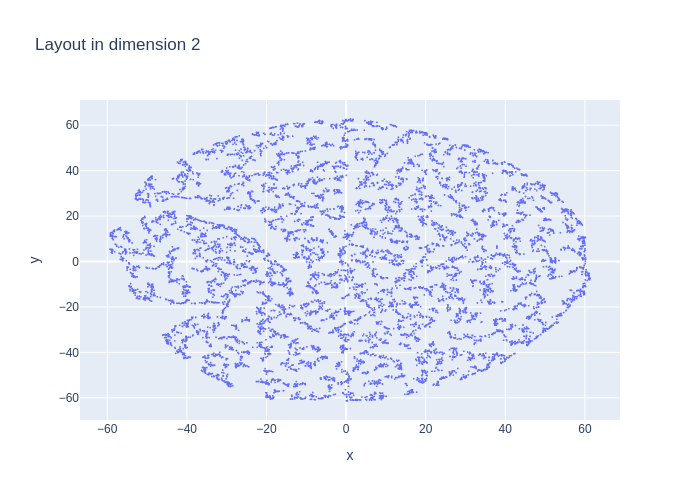

Computing persistence up to dimension 1 and global metrics
done


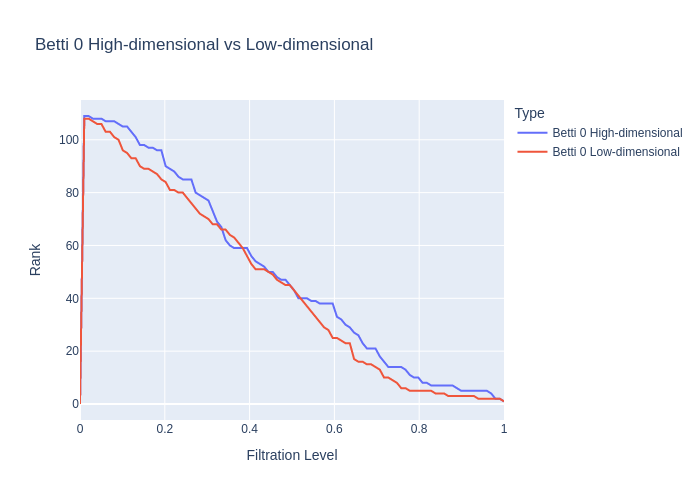

Distance `DTW` for dimension 0: 0.8565537872815147
Distance `TWED` for dimension 0: 0.14536048220945622
Distance `EMD` for dimension 0: 0.0048861350156743765
Distance `Wasserstein` for dimension 0: 0.5146034504279114
Distance `bottleneck` for dimension 0: 8.441732406616211


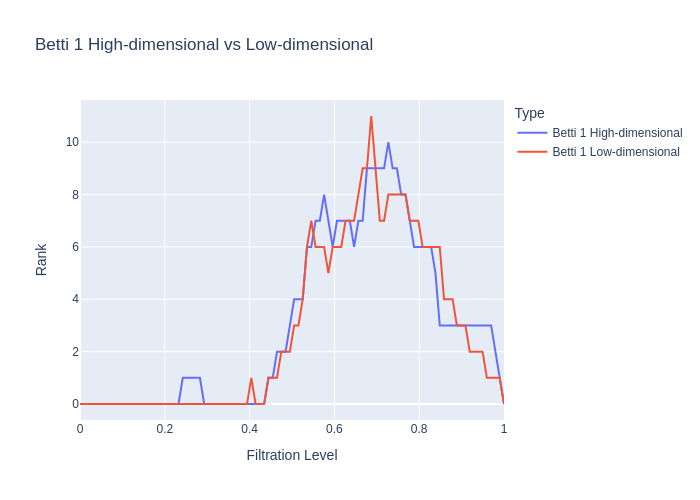

Distance `DTW` for dimension 1: 1.3084330512064812
Distance `TWED` for dimension 1: 0.06900135293617285
Distance `EMD` for dimension 1: 0.01955271194129385
Distance `Wasserstein` for dimension 1: 0.05442875067038718
Distance `bottleneck` for dimension 1: 6.126760005950928
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.009315837612300065
Neighborhood preservation score (mean, std): [0.21665357053279877, 0.14148485660552979]
Data has no labels: no context analysis performed


In [ ]:
tred_disk = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.2588 seconds


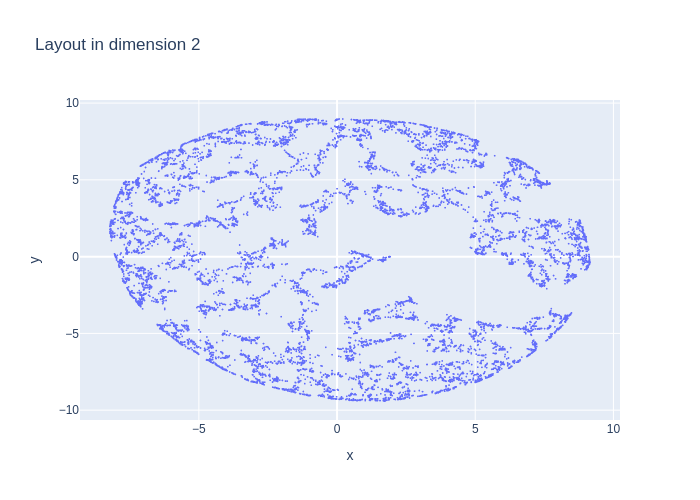

Computing persistence up to dimension 1 and global metrics
done


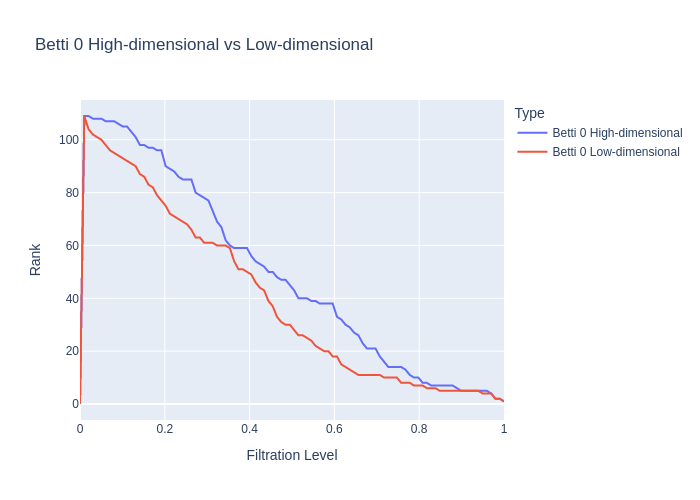

Distance `DTW` for dimension 0: 0.17975991010615386
Distance `TWED` for dimension 0: 0.1541404246824997
Distance `EMD` for dimension 0: 0.0007798420171707604
Distance `Wasserstein` for dimension 0: 0.07313669324439237
Distance `bottleneck` for dimension 0: 1.3479187488555908


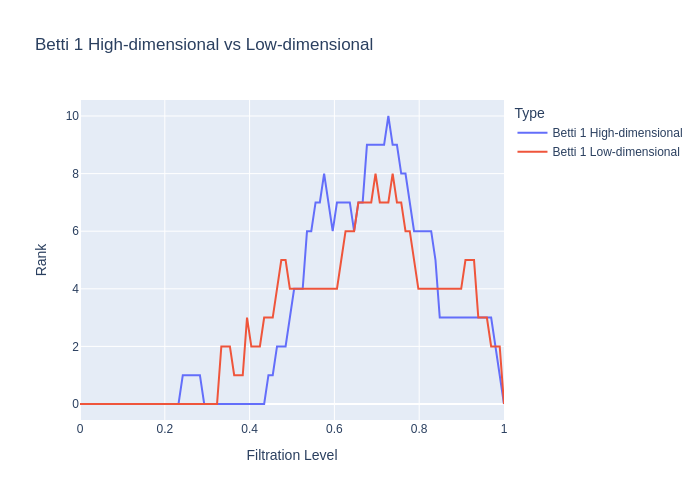

Distance `DTW` for dimension 1: 0.22519468527214517
Distance `TWED` for dimension 1: 0.09452874162543612
Distance `EMD` for dimension 1: 0.002896611072968076
Distance `Wasserstein` for dimension 1: 0.00994498937924897
Distance `bottleneck` for dimension 1: 0.9095554351806641
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.21544854131618768
Neighborhood preservation score (mean, std): [0.18266557157039642, 0.12725721299648285]
Data has no labels: no context analysis performed


In [ ]:
cured_disk = cUMAP(n_components=reducer_disk.dimension,
                   n_neighbors=reducer_disk.n_neighbors,
                   min_dist=reducer_disk.min_dist,
                   spread=reducer_disk.spread)
#
viz_benchmark(cured_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 7.1815 seconds


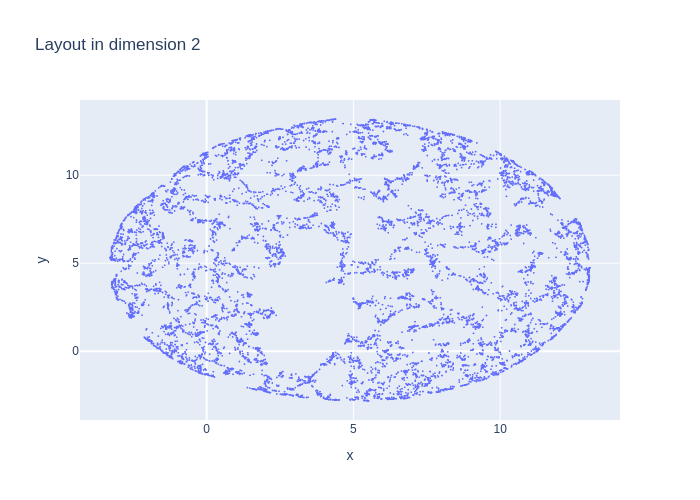

Computing persistence up to dimension 1 and global metrics
done


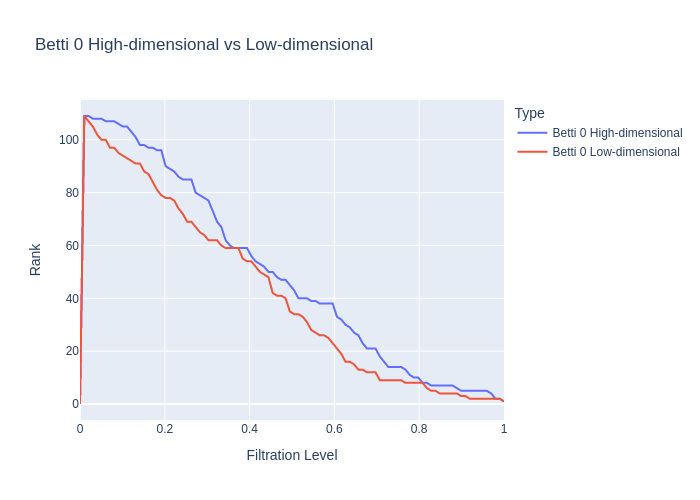

Distance `DTW` for dimension 0: 0.15843861674987686
Distance `TWED` for dimension 0: 0.15602157343110865
Distance `EMD` for dimension 0: 0.0006446061163407833
Distance `Wasserstein` for dimension 0: 0.06702993070492898
Distance `bottleneck` for dimension 0: 1.1752694845199585


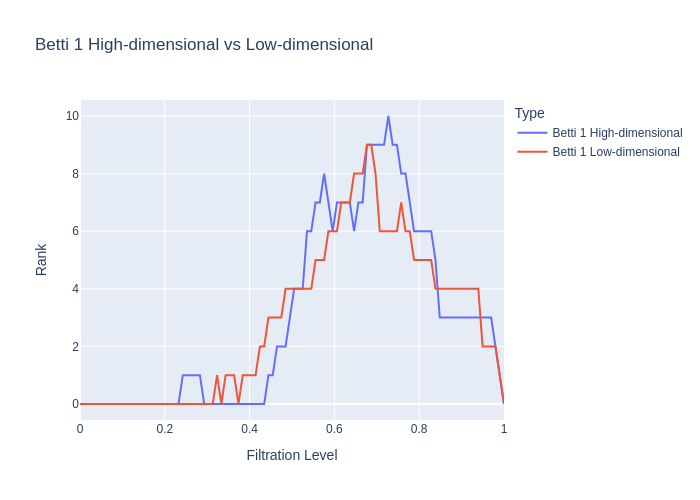

Distance `DTW` for dimension 1: 0.1912947784805937
Distance `TWED` for dimension 1: 0.08872123769662837
Distance `EMD` for dimension 1: 0.0024777747840958857
Distance `Wasserstein` for dimension 1: 0.008724917459647506
Distance `bottleneck` for dimension 1: 0.7323302030563354
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.26114285938239495
Neighborhood preservation score (mean, std): [0.19117984175682068, 0.13154348731040955]
Data has no labels: no context analysis performed


In [ ]:
red_disk = UMAP(n_components=reducer_disk.dimension,
                n_neighbors=reducer_disk.n_neighbors,
                min_dist=reducer_disk.min_dist,
                spread=reducer_disk.spread)
#
viz_benchmark(red_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

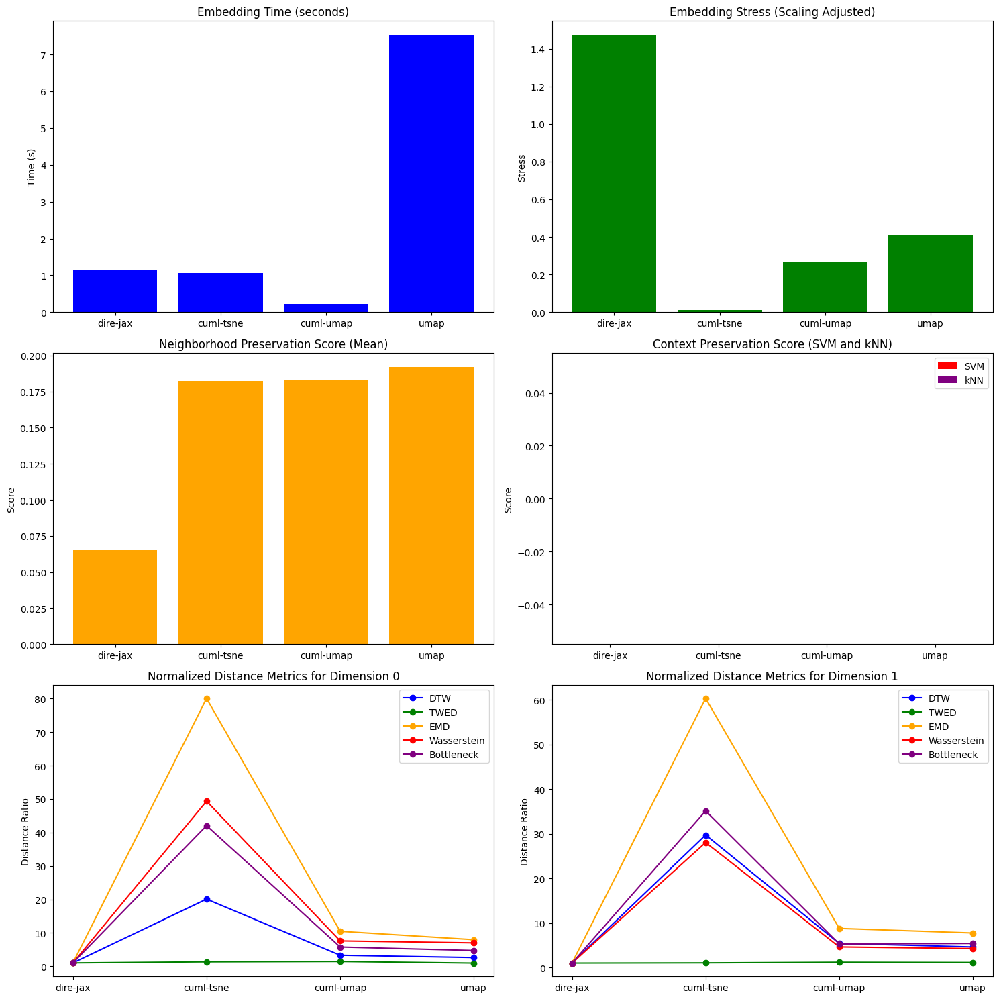

In [ ]:
plot_algorithm_comparison(benchmarks_disk)

## Dataset "Sphere Uniform"

In [ ]:
def rand_point_sphere(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  pts = prepts/prenorms
  return pts

In [ ]:
features_sphere, labels_sphere = rand_point_sphere(3, 10000), None

### DiRe reducer

In [ ]:
reducer_sphere = DiRe(dimension=3,
                      n_neighbors=64,
                      init_embedding_type='pca',
                      max_iter_layout=32,
                      min_dist=1e-4,
                      spread=2.0,
                      cutoff=2.0,
                      n_sample_dirs=8,
                      sample_size=32,
                      neg_ratio=8,
                      verbose=False,)

100%|██████████| 32/32 [00:02<00:00, 15.46it/s]


Embedding time: 3.3504 seconds


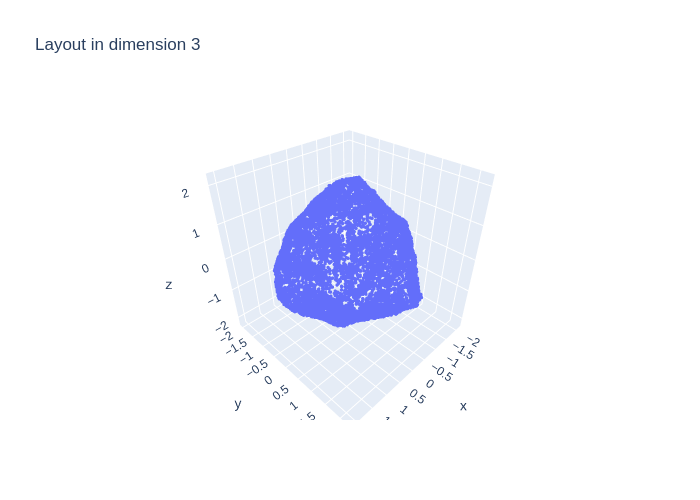

Computing persistence up to dimension 1 and global metrics
done


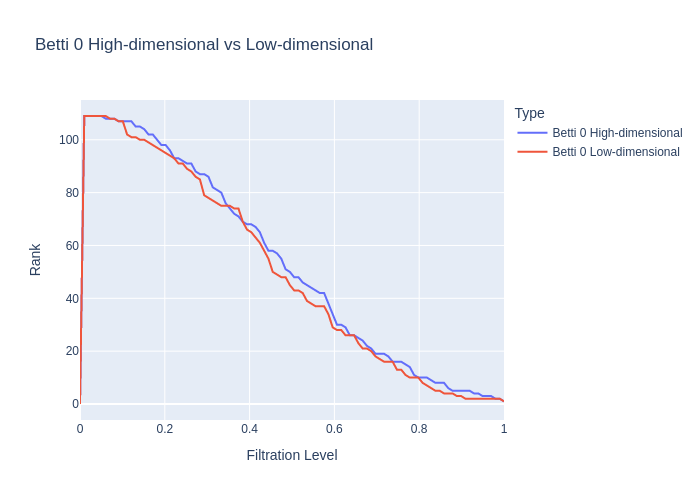

Distance `DTW` for dimension 0: 0.071668487043574
Distance `TWED` for dimension 0: 0.13284300289209125
Distance `EMD` for dimension 0: 9.963177978419008e-05
Distance `Wasserstein` for dimension 0: 0.01532045165721137
Distance `bottleneck` for dimension 0: 0.3574732542037964


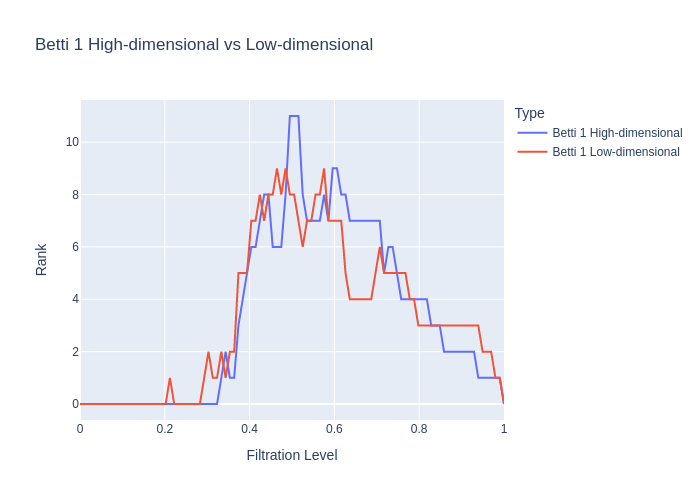

Distance `DTW` for dimension 1: 0.06732370774385685
Distance `TWED` for dimension 1: 0.08473684331106383
Distance `EMD` for dimension 1: 0.00046752200399036235
Distance `Wasserstein` for dimension 1: 0.004716179505199113
Distance `bottleneck` for dimension 1: 0.5187457501888275
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.44966357673596824
Neighborhood preservation score (mean, std): [0.24189265072345734, 0.14682990312576294]
Data has no labels: no context analysis performed


In [ ]:
viz_benchmark(reducer_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_sphere = {}

In [ ]:
benchmark = run_benchmark(reducer_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:00<00:00, 38.11it/s]


### CuML tSNE reducer

Embedding time: 1.0711 seconds


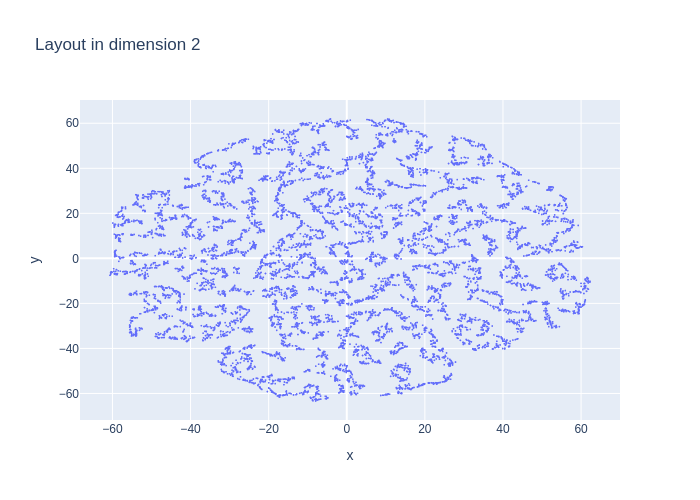

Computing persistence up to dimension 1 and global metrics
done


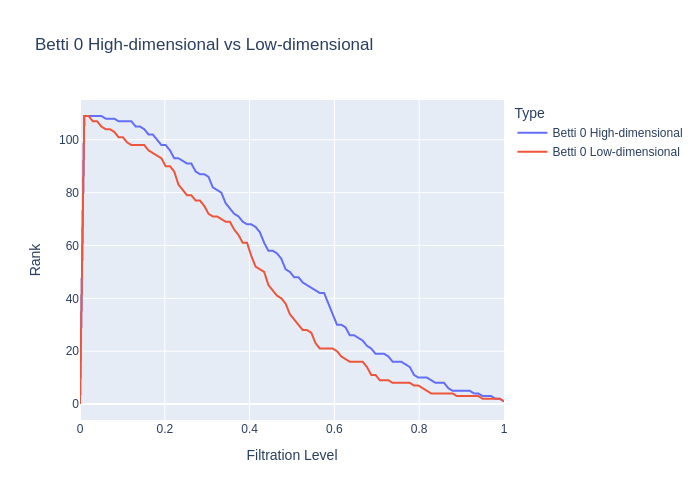

Distance `DTW` for dimension 0: 0.8080933037021817
Distance `TWED` for dimension 0: 0.14144326174224767
Distance `EMD` for dimension 0: 0.004820286175221018
Distance `Wasserstein` for dimension 0: 0.5030089603291746
Distance `bottleneck` for dimension 0: 8.172660827636719


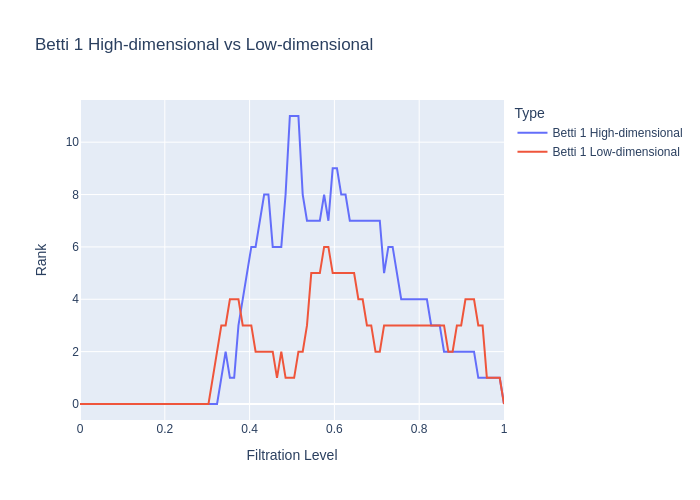

Distance `DTW` for dimension 1: 1.4038730340558465
Distance `TWED` for dimension 1: 0.11869142328579915
Distance `EMD` for dimension 1: 0.029174818135307777
Distance `Wasserstein` for dimension 1: 0.04354017190675422
Distance `bottleneck` for dimension 1: 6.293323516845703
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.024677317371245993
Neighborhood preservation score (mean, std): [0.15000717341899872, 0.11725392192602158]
Data has no labels: no context analysis performed


In [ ]:
tred_sphere = cTSNE(n_components=2,
                    method='fft',
                    perplexity=25,
                    n_neighbors=3*25+1)
#
viz_benchmark(tred_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.2693 seconds


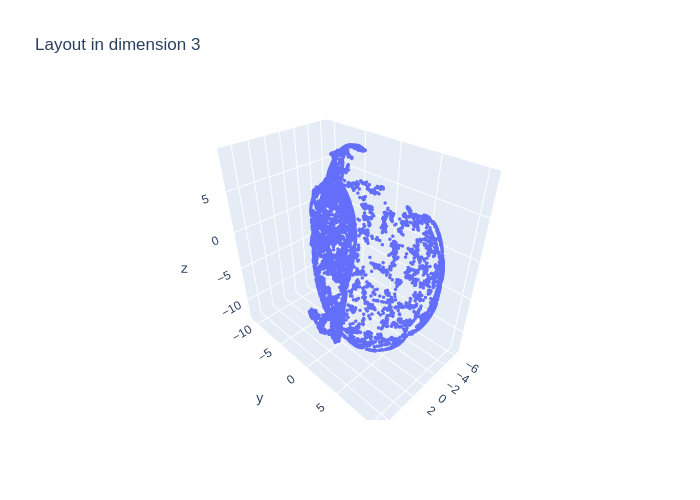

Computing persistence up to dimension 1 and global metrics
done


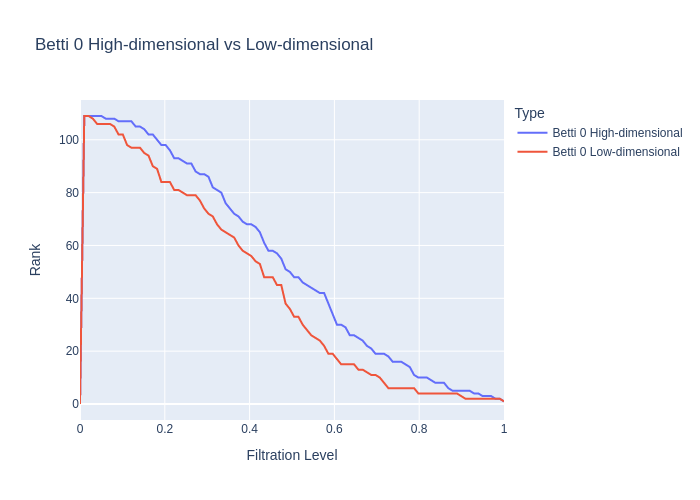

Distance `DTW` for dimension 0: 0.22164556687779272
Distance `TWED` for dimension 0: 0.15801025331880866
Distance `EMD` for dimension 0: 0.0010662537943439156
Distance `Wasserstein` for dimension 0: 0.1207388486179381
Distance `bottleneck` for dimension 0: 1.9908443689346313


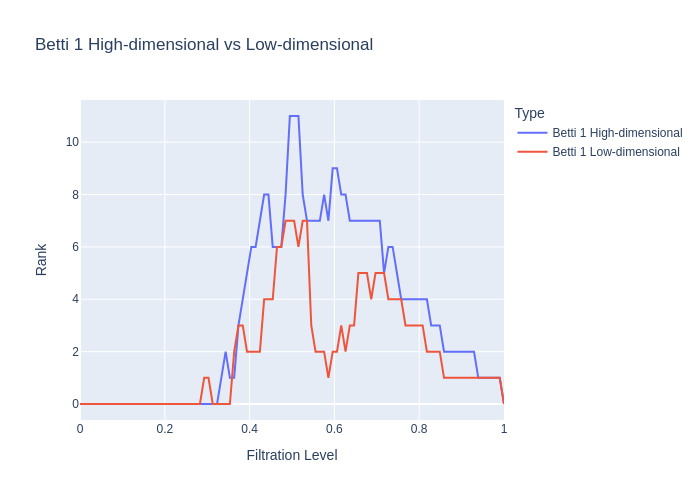

Distance `DTW` for dimension 1: 0.3386602820994872
Distance `TWED` for dimension 1: 0.10042046261476255
Distance `EMD` for dimension 1: 0.005973469423622003
Distance `Wasserstein` for dimension 1: 0.011281870133400996
Distance `bottleneck` for dimension 1: 1.1677396297454834
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.13692601312110778
Neighborhood preservation score (mean, std): [0.21662843227386475, 0.14571450650691986]
Data has no labels: no context analysis performed


In [ ]:
cured_sphere = cUMAP(n_components=reducer_sphere.dimension,
                     n_neighbors=reducer_sphere.n_neighbors,
                     min_dist=reducer_sphere.min_dist,
                     spread=reducer_sphere.spread)
#
viz_benchmark(cured_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 7.2071 seconds


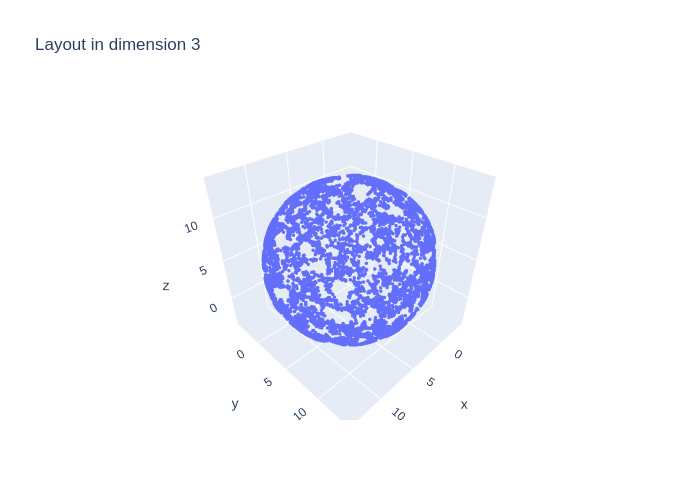

Computing persistence up to dimension 1 and global metrics
done


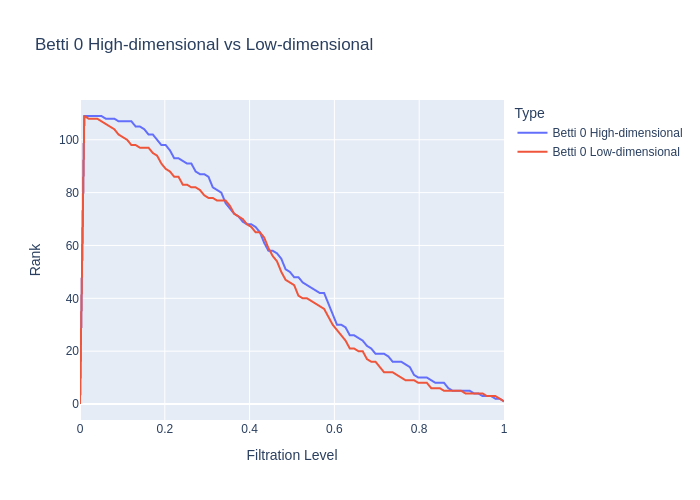

Distance `DTW` for dimension 0: 0.21289922505345052
Distance `TWED` for dimension 0: 0.12343379324508241
Distance `EMD` for dimension 0: 0.0010704406639851956
Distance `Wasserstein` for dimension 0: 0.13842859585025008
Distance `bottleneck` for dimension 0: 2.01408314704895


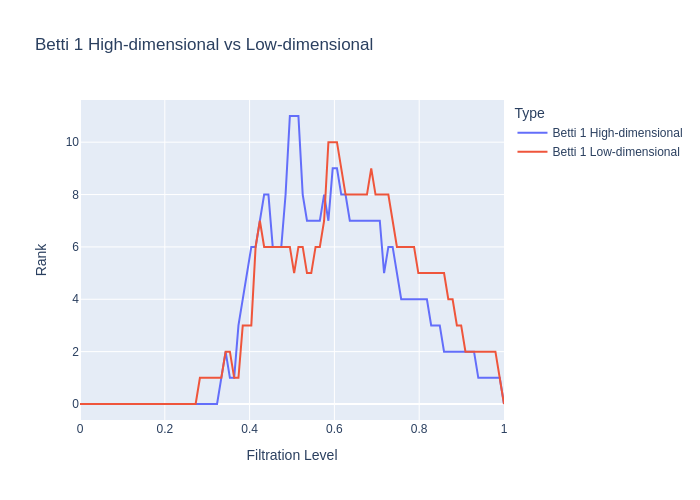

Distance `DTW` for dimension 1: 0.35215221583068146
Distance `TWED` for dimension 1: 0.08510561696145258
Distance `EMD` for dimension 1: 0.004562164028230591
Distance `Wasserstein` for dimension 1: 0.021195979360494298
Distance `bottleneck` for dimension 1: 2.1244418621063232
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.10787740050045391
Neighborhood preservation score (mean, std): [0.21634237468242645, 0.1470414400100708]
Data has no labels: no context analysis performed


In [ ]:
red_sphere = UMAP(n_components=reducer_sphere.dimension,
                  n_neighbors=reducer_sphere.n_neighbors,
                  min_dist=reducer_sphere.min_dist,
                  spread=reducer_sphere.spread)
#
viz_benchmark(red_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

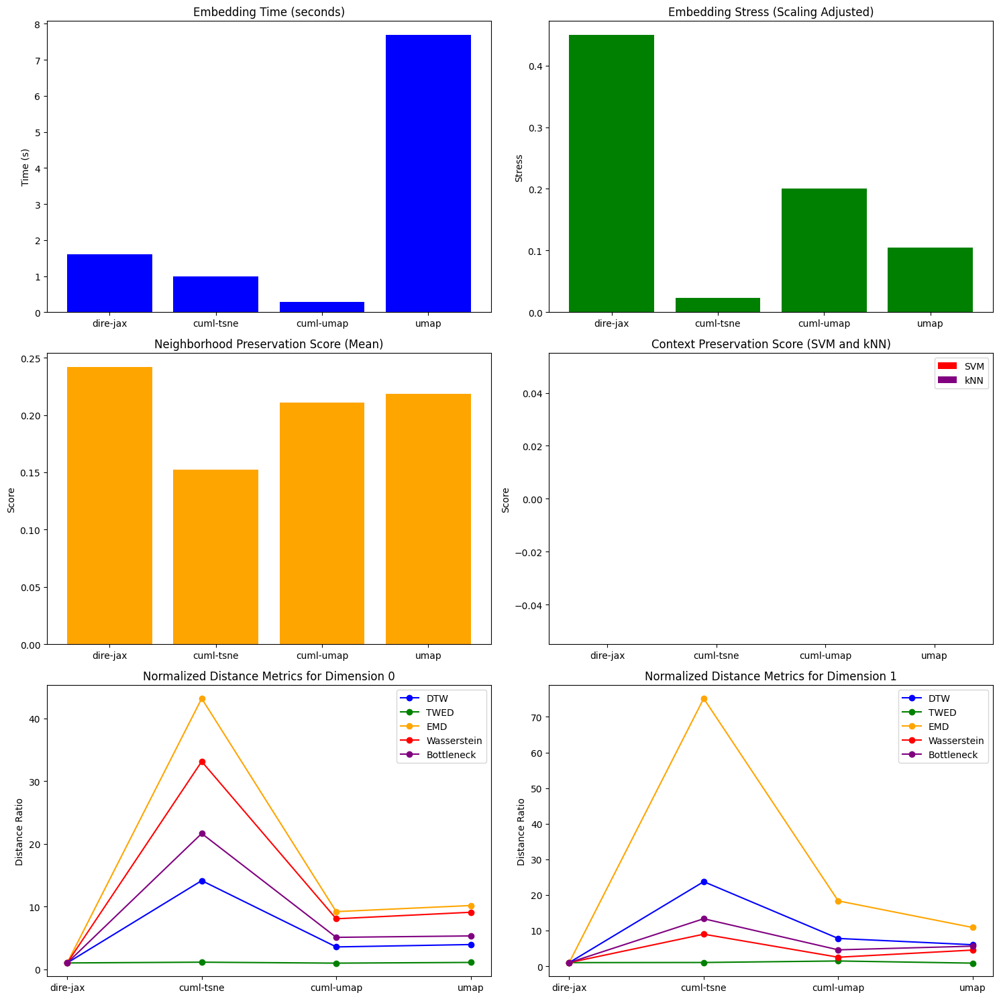

In [ ]:
plot_algorithm_comparison(benchmarks_sphere)

## Dataset "Ellipsoid Uniform"

In [ ]:
class elgen:
  def __init__(self, a):
    a = np.array(a)
    themat = np.diag(1/(a * a))
    L = np.linalg.inv(np.linalg.cholesky(themat).T)
    self.L = L

  def __call__(self, ar):
    return (self.L @ ar.T).T

def rand_point_ell(a, n, num=1):
  spts = rand_point_sphere(n, num)
  eg = elgen(a)
  return eg(spts)

In [ ]:
features_ell, labels_ell = rand_point_ell([1,2,4], 3, 10000), None

### DiRe reducer

In [ ]:
reducer_ell = DiRe(dimension=3,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=8,
                   sample_size=32,
                   neg_ratio=8,
                   verbose=False,)

100%|██████████| 64/64 [00:01<00:00, 39.14it/s]


Embedding time: 2.4253 seconds


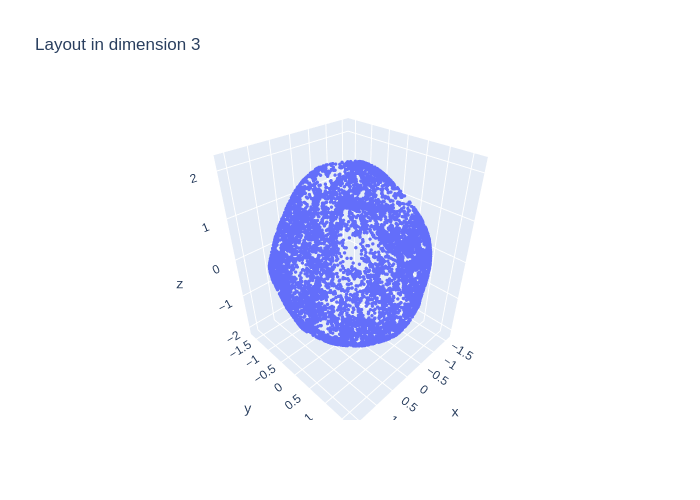

Computing persistence up to dimension 1 and global metrics
done


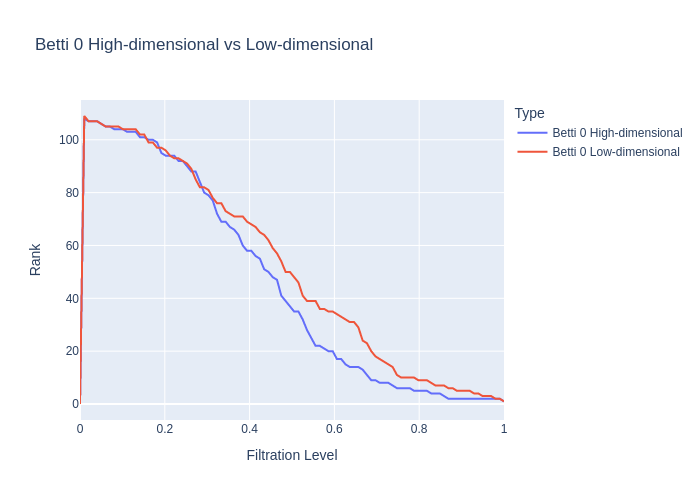

Distance `DTW` for dimension 0: 0.070240770057296
Distance `TWED` for dimension 0: 0.1289884330448448
Distance `EMD` for dimension 0: 8.581608149819017e-05
Distance `Wasserstein` for dimension 0: 0.012896619243058299
Distance `bottleneck` for dimension 0: 0.40574920177459717


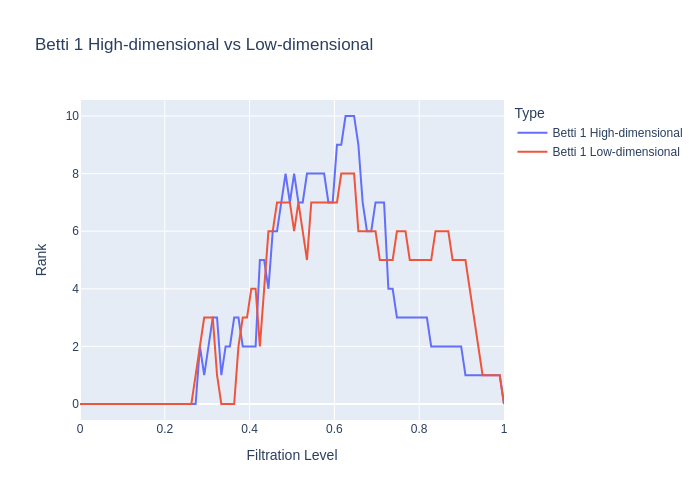

Distance `DTW` for dimension 1: 0.058243453137896195
Distance `TWED` for dimension 1: 0.10396292487283071
Distance `EMD` for dimension 1: 0.0002349880526635257
Distance `Wasserstein` for dimension 1: 0.003293308403956624
Distance `bottleneck` for dimension 1: 0.47990262508392334
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.1934606455006331
Neighborhood preservation score (mean, std): [0.17619360983371735, 0.1189609095454216]
Data has no labels: no context analysis performed


In [ ]:
viz_benchmark(reducer_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_ell = {}

In [ ]:
benchmark = run_benchmark(reducer_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:01<00:00, 40.17it/s]


### CuML tSNE reducer

Embedding time: 1.0219 seconds


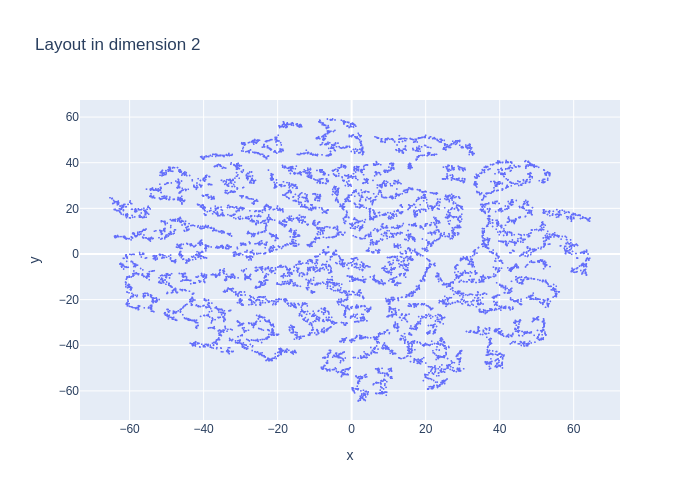

Computing persistence up to dimension 1 and global metrics
done


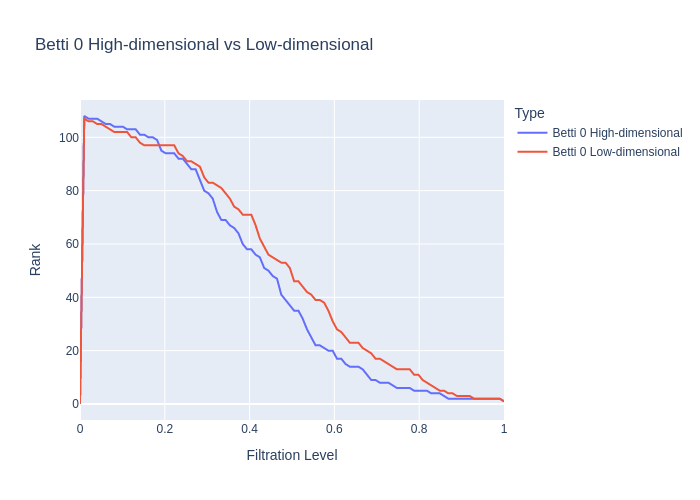

Distance `DTW` for dimension 0: 0.7987213690646771
Distance `TWED` for dimension 0: 0.13761058877131707
Distance `EMD` for dimension 0: 0.00456397717474877
Distance `Wasserstein` for dimension 0: 0.559835425563828
Distance `bottleneck` for dimension 0: 7.788652420043945


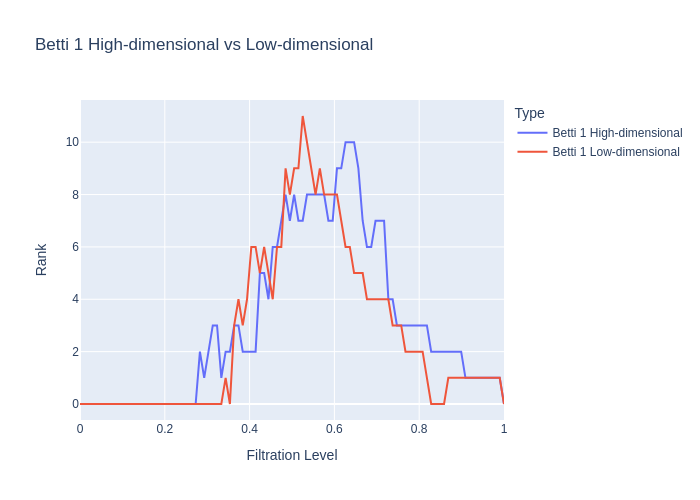

Distance `DTW` for dimension 1: 1.3021675096531078
Distance `TWED` for dimension 1: 0.09976526724821794
Distance `EMD` for dimension 1: 0.017634671933609774
Distance `Wasserstein` for dimension 1: 0.057436621909222996
Distance `bottleneck` for dimension 1: 5.371038913726807
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.05439731137047179
Neighborhood preservation score (mean, std): [0.1556159406900406, 0.11540241539478302]
Data has no labels: no context analysis performed


In [ ]:
tred_ell = cTSNE(n_components=2,
                 method='fft',
                 perplexity=25,
                 n_neighbors=3*25+1)
#
viz_benchmark(tred_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.3077 seconds


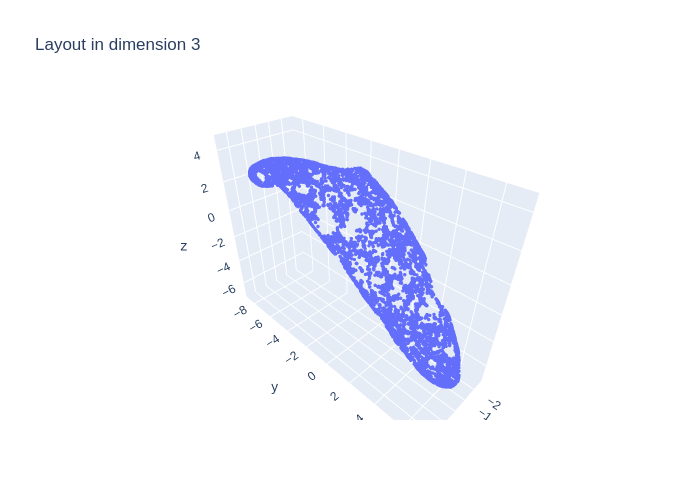

Computing persistence up to dimension 1 and global metrics
done


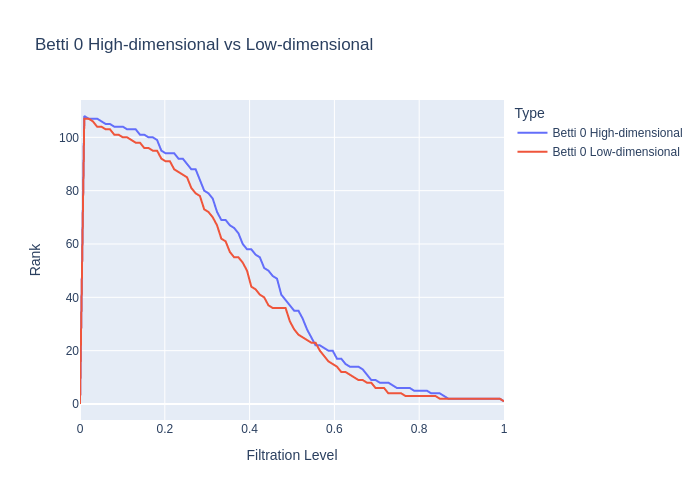

Distance `DTW` for dimension 0: 0.10049572234279731
Distance `TWED` for dimension 0: 0.12327140976994858
Distance `EMD` for dimension 0: 0.00029244386093006013
Distance `Wasserstein` for dimension 0: 0.04137287243517031
Distance `bottleneck` for dimension 0: 1.183347225189209


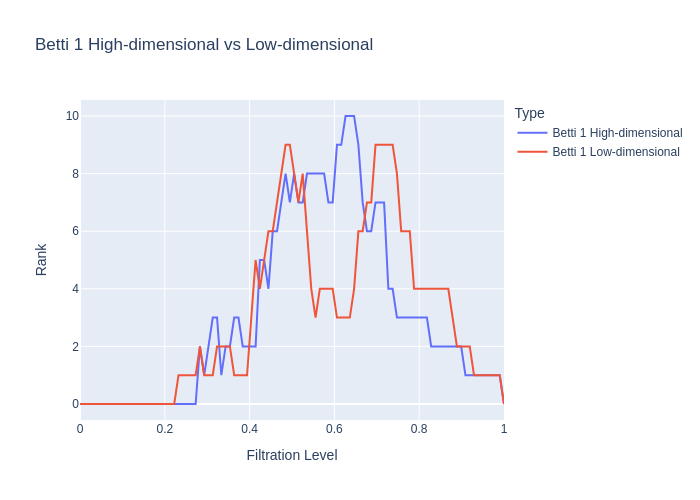

Distance `DTW` for dimension 1: 0.14319953349955167
Distance `TWED` for dimension 1: 0.0925036036589607
Distance `EMD` for dimension 1: 0.0011389116866344995
Distance `Wasserstein` for dimension 1: 0.009947178071851272
Distance `bottleneck` for dimension 1: 0.837018609046936
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.0953840349456727
Neighborhood preservation score (mean, std): [0.1952487677335739, 0.131781667470932]
Data has no labels: no context analysis performed


In [ ]:
cured_ell = cUMAP(n_components=reducer_ell.dimension,
                  n_neighbors=reducer_ell.n_neighbors,
                  min_dist=reducer_ell.min_dist,
                  spread=reducer_ell.spread)
#
viz_benchmark(cured_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 8.3309 seconds


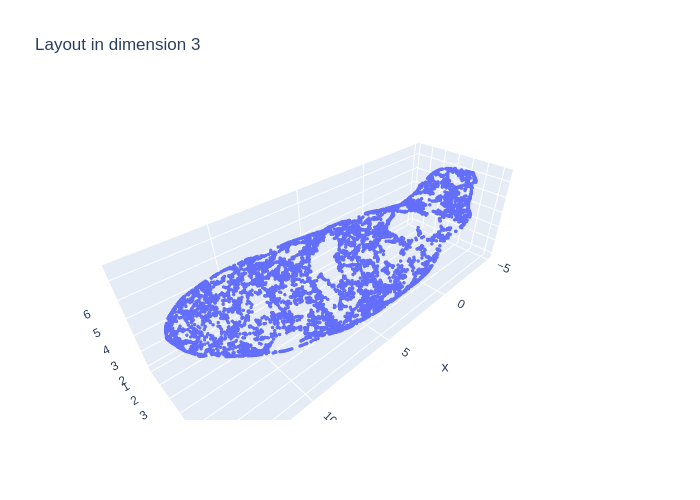

Computing persistence up to dimension 1 and global metrics
done


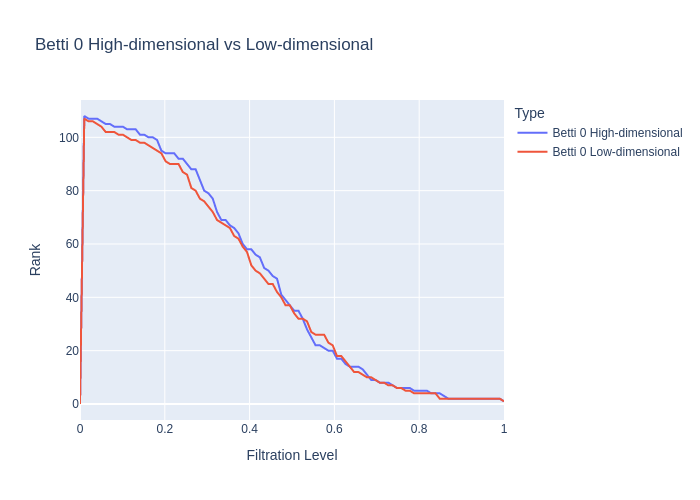

Distance `DTW` for dimension 0: 0.09956115658264329
Distance `TWED` for dimension 0: 0.12712329207301942
Distance `EMD` for dimension 0: 0.00028828603337099787
Distance `Wasserstein` for dimension 0: 0.04373801648327952
Distance `bottleneck` for dimension 0: 1.1064783334732056


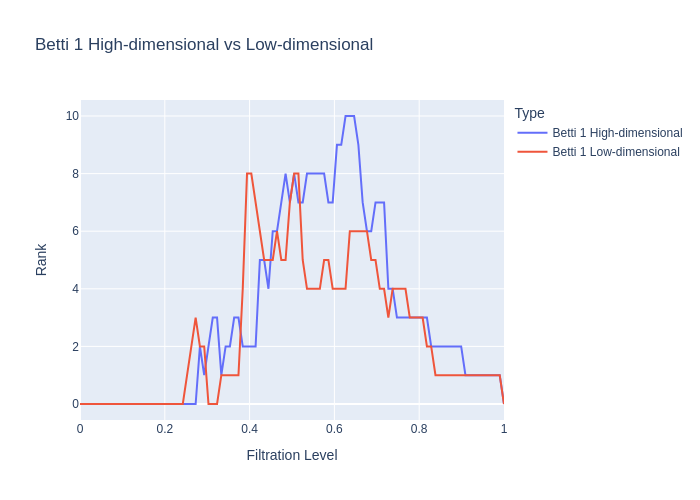

Distance `DTW` for dimension 1: 0.16402238683468323
Distance `TWED` for dimension 1: 0.11369220928232526
Distance `EMD` for dimension 1: 0.0017047484451573926
Distance `Wasserstein` for dimension 1: 0.010576850581028054
Distance `bottleneck` for dimension 1: 1.1554927825927734
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.07601783889829
Neighborhood preservation score (mean, std): [0.19870442152023315, 0.13915596902370453]
Data has no labels: no context analysis performed


In [ ]:
red_ell = UMAP(n_components=reducer_ell.dimension,
               n_neighbors=reducer_ell.n_neighbors,
               min_dist=reducer_ell.min_dist,
               spread=reducer_ell.spread)
#
viz_benchmark(red_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

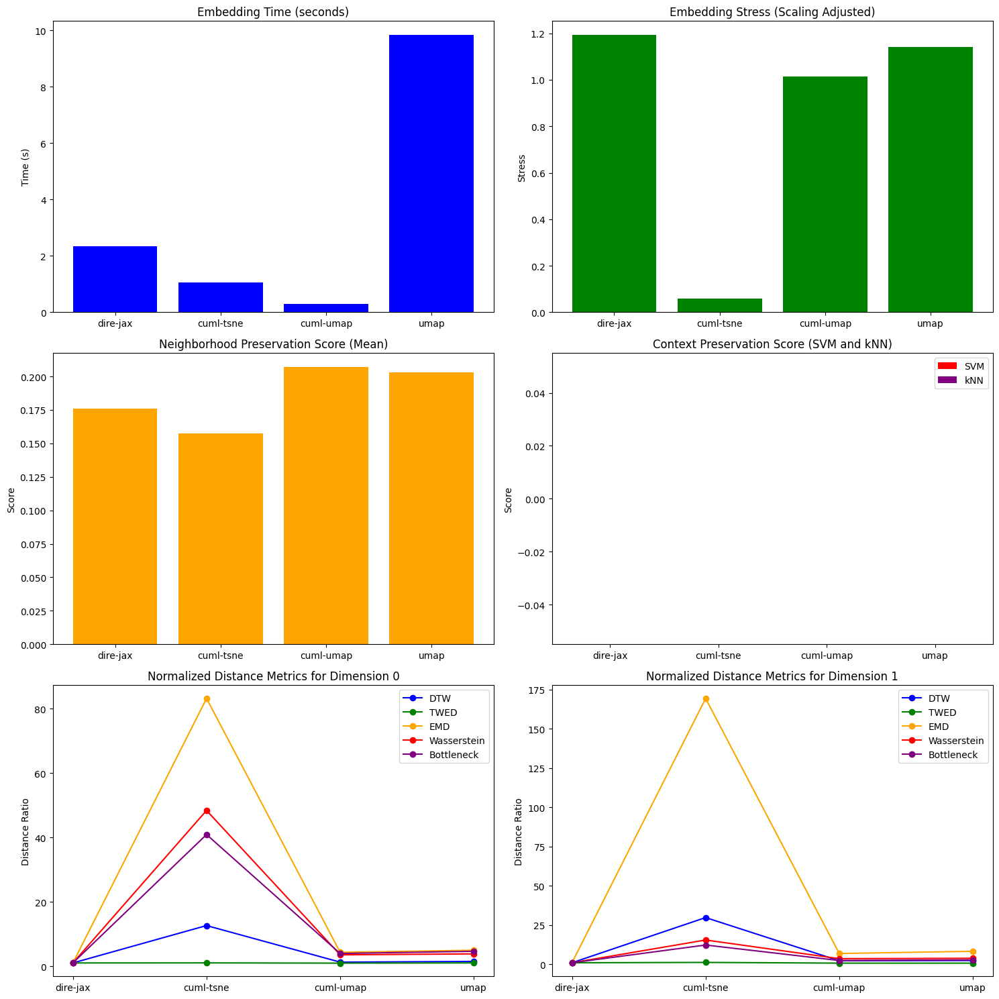

In [ ]:
plot_algorithm_comparison(benchmarks_ell)

## Dataset "Two half-moons"

In [ ]:
from sklearn.datasets import make_moons
#
# Generate some sample data
#
n_samples  = 10_000
features_moons, labels_moons = make_moons(n_samples=n_samples, noise=0.005, random_state=42)

### DiRe reducer

In [ ]:
reducer_moons = DiRe(dimension=2,
                     n_neighbors=64,
                     init_embedding_type='pca',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=16,
                     sample_size=16,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:06<00:00, 18.89it/s]


Embedding time: 7.5926 seconds


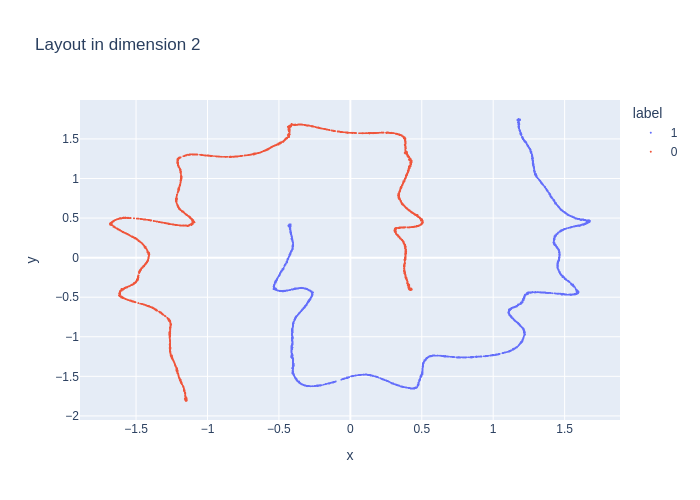

Computing persistence up to dimension 1 and global metrics
done


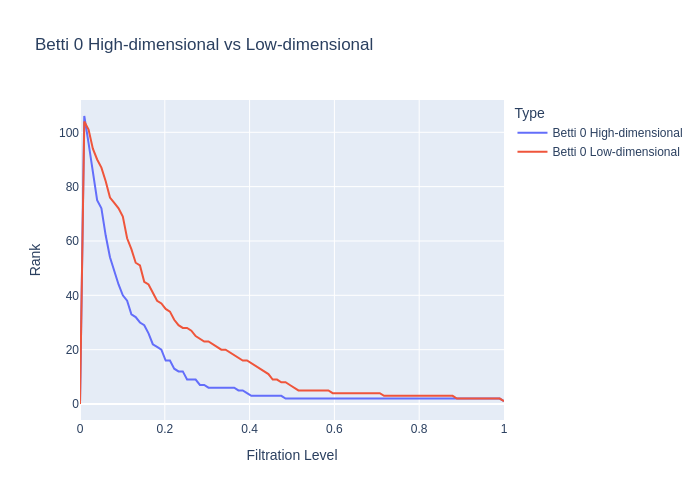

Distance `DTW` for dimension 0: 0.08355818135909433
Distance `TWED` for dimension 0: 0.17903660029832622
Distance `EMD` for dimension 0: 0.00010068711956736475
Distance `Wasserstein` for dimension 0: 0.006802709840485098
Distance `bottleneck` for dimension 0: 0.3400573134422302


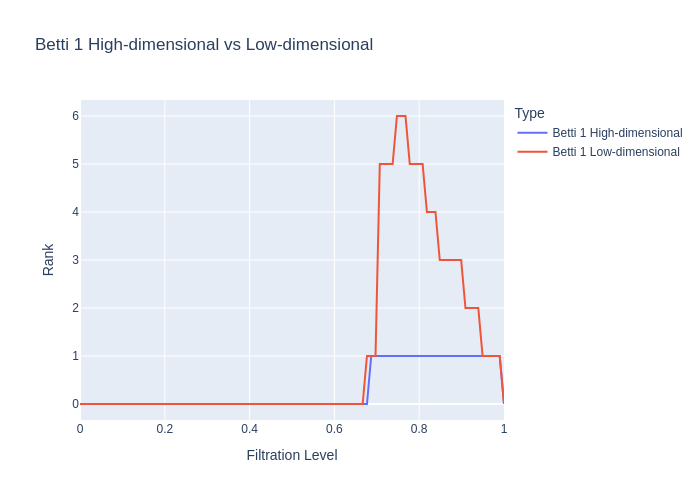

Distance `DTW` for dimension 1: 0.07311440230475107
Distance `TWED` for dimension 1: 0.05391239316791612
Distance `EMD` for dimension 1: 0.0006254638047732324
Distance `Wasserstein` for dimension 1: 0.0009253722292355235
Distance `bottleneck` for dimension 1: 0.1712929606437683
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.299988570839894
Neighborhood preservation score (mean, std): [0.383232444524765, 0.22037993371486664]
Computing context measures
done
Context preservation score (SVM): [0.8814102564102564, 0.8012820512820513, -0.09531017980432477]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
viz_benchmark(reducer_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_moons = {}

In [ ]:
benchmark = run_benchmark(reducer_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:05<00:00, 21.57it/s]


### CuML tSNE reducer

Embedding time: 1.0661 seconds


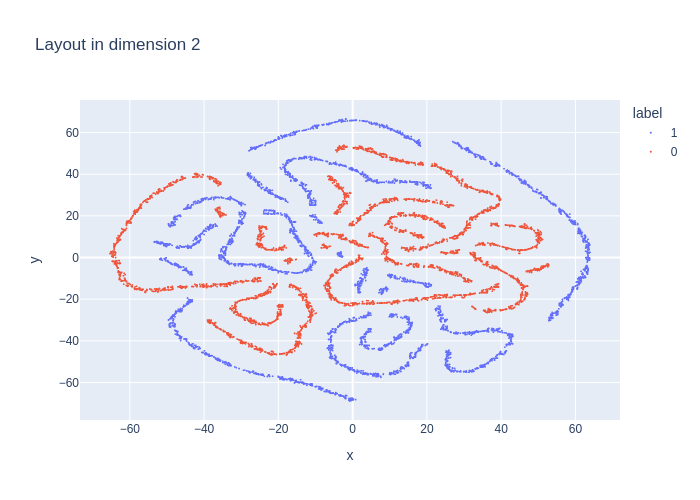

Computing persistence up to dimension 1 and global metrics
done


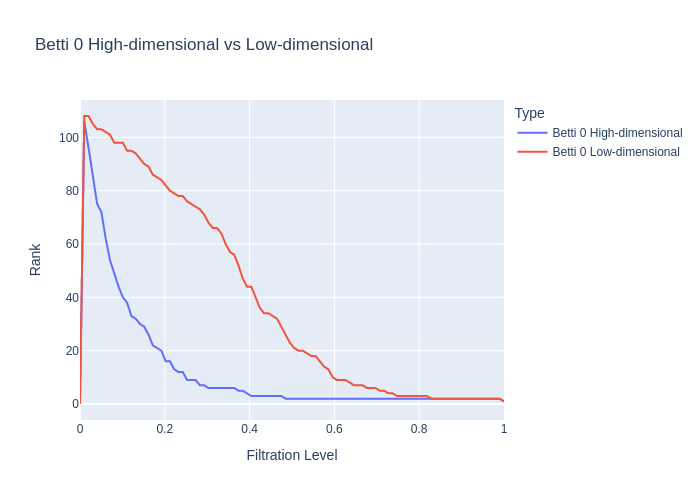

Distance `DTW` for dimension 0: 1.4001924288516372
Distance `TWED` for dimension 0: 0.18431348314184312
Distance `EMD` for dimension 0: 0.014171282800411314
Distance `Wasserstein` for dimension 0: 0.5265150174481472
Distance `bottleneck` for dimension 0: 10.05223274230957


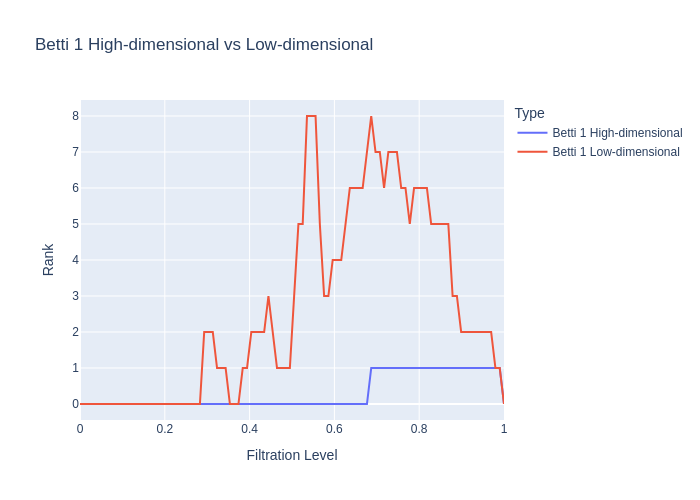

Distance `DTW` for dimension 1: 1.1578514861267326
Distance `TWED` for dimension 1: 0.14106568381462795
Distance `EMD` for dimension 1: 0.13254633366047042
Distance `Wasserstein` for dimension 1: 0.04575795755267321
Distance `bottleneck` for dimension 1: 4.707344055175781
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.0047060178911687055
Neighborhood preservation score (mean, std): [0.3715361952781677, 0.25964826345443726]
Computing context measures
done
Context preservation score (SVM): [0.8814102564102564, 0.4583333333333333, -0.6539264674066639]
Context preservation score (kNN): [1.0, 0.9816666666666667, -0.018503471564559643]


In [ ]:
tred_moons = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.2481 seconds


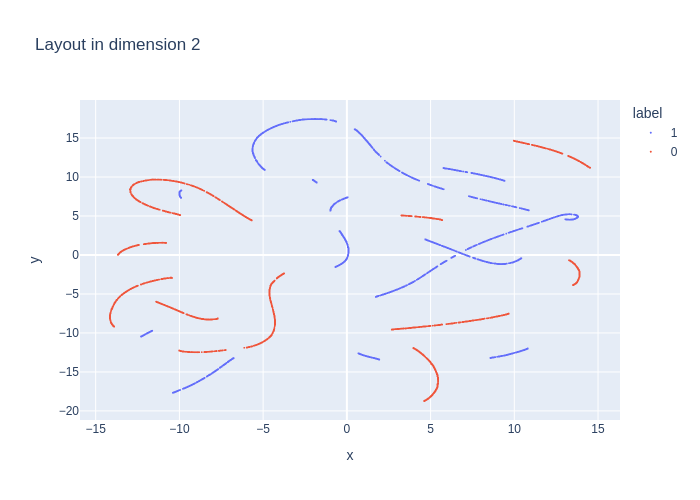

Computing persistence up to dimension 1 and global metrics
done


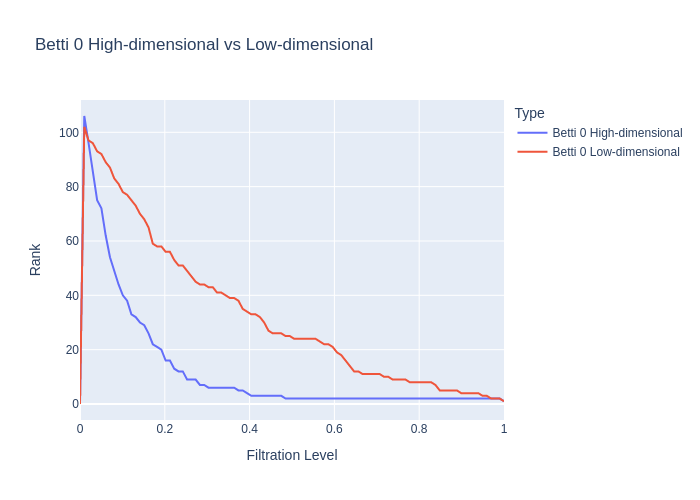

Distance `DTW` for dimension 0: 0.5206960951990687
Distance `TWED` for dimension 0: 0.22542967810093842
Distance `EMD` for dimension 0: 0.0035236784996384362
Distance `Wasserstein` for dimension 0: 0.11842469919664393
Distance `bottleneck` for dimension 0: 2.715186595916748


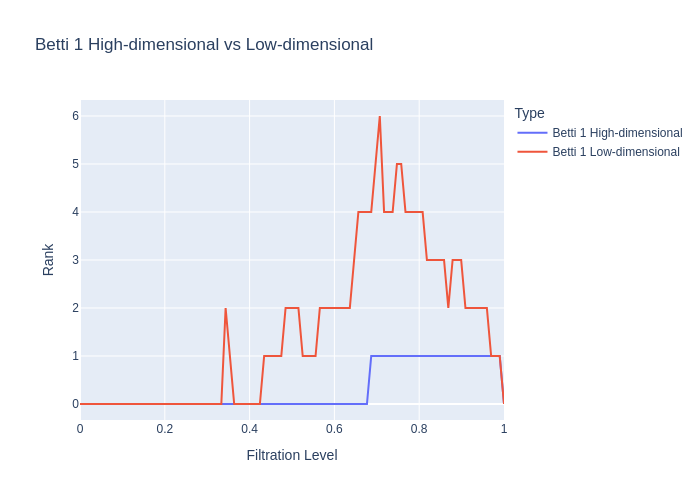

Distance `DTW` for dimension 1: 0.35811056890513243
Distance `TWED` for dimension 1: 0.10225971210909303
Distance `EMD` for dimension 1: 0.024751299786544622
Distance `Wasserstein` for dimension 1: 0.00873398992373166
Distance `bottleneck` for dimension 1: 1.23734450340271
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.9029393494710718
Neighborhood preservation score (mean, std): [0.37105751037597656, 0.23622643947601318]
Computing context measures
done
Context preservation score (SVM): [0.8814102564102564, 0.7628205128205128, -0.14450042399509658]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
cured_moons = cUMAP(n_components=reducer_moons.dimension,
                    n_neighbors=reducer_moons.n_neighbors,
                    min_dist=reducer_moons.min_dist,
                    spread=reducer_moons.spread)
#
viz_benchmark(cured_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 10.4068 seconds


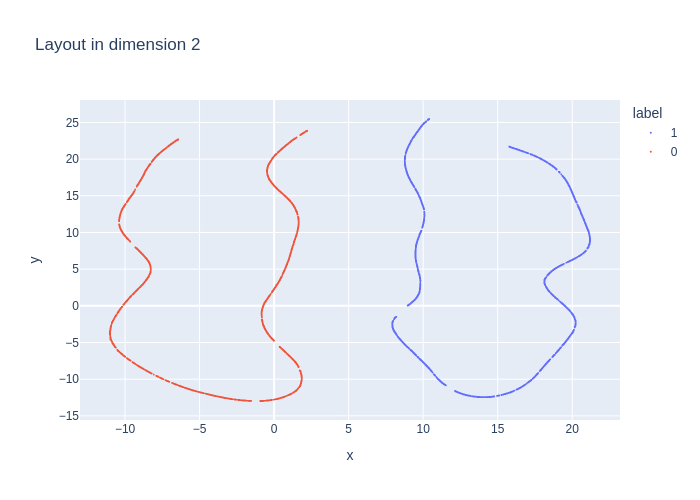

Computing persistence up to dimension 1 and global metrics
done


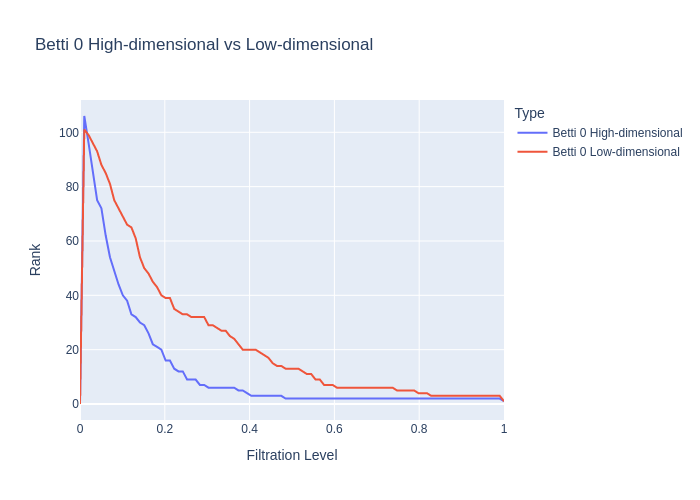

Distance `DTW` for dimension 0: 0.5141048219824006
Distance `TWED` for dimension 0: 0.18510961303123497
Distance `EMD` for dimension 0: 0.0028614186500632364
Distance `Wasserstein` for dimension 0: 0.11348395390415662
Distance `bottleneck` for dimension 0: 3.5601603984832764


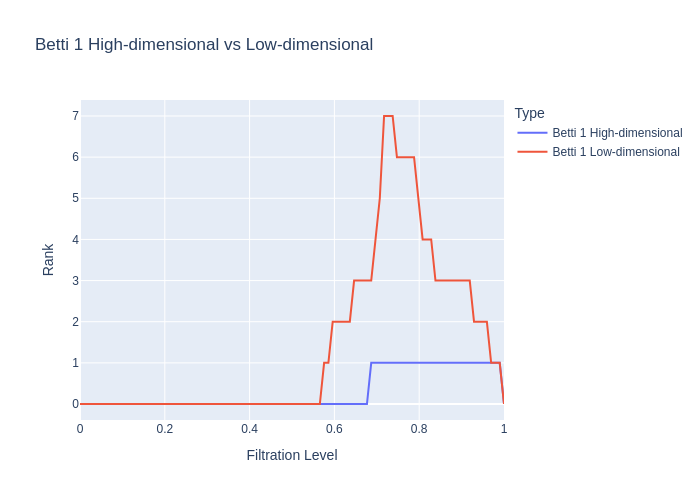

Distance `DTW` for dimension 1: 0.5309292081019097
Distance `TWED` for dimension 1: 0.0812994302523836
Distance `EMD` for dimension 1: 0.037679343093590036
Distance `Wasserstein` for dimension 1: 0.011952472554563009
Distance `bottleneck` for dimension 1: 2.4260520935058594
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.8003703330492535
Neighborhood preservation score (mean, std): [0.39215418696403503, 0.2320631593465805]
Computing context measures
done
Context preservation score (SVM): [0.8814102564102564, 1.0, -0.1262320901429111]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [ ]:
red_moons = UMAP(n_components=reducer_moons.dimension,
                 n_neighbors=reducer_moons.n_neighbors,
                 min_dist=reducer_moons.min_dist,
                 spread=reducer_moons.spread)
#
viz_benchmark(red_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

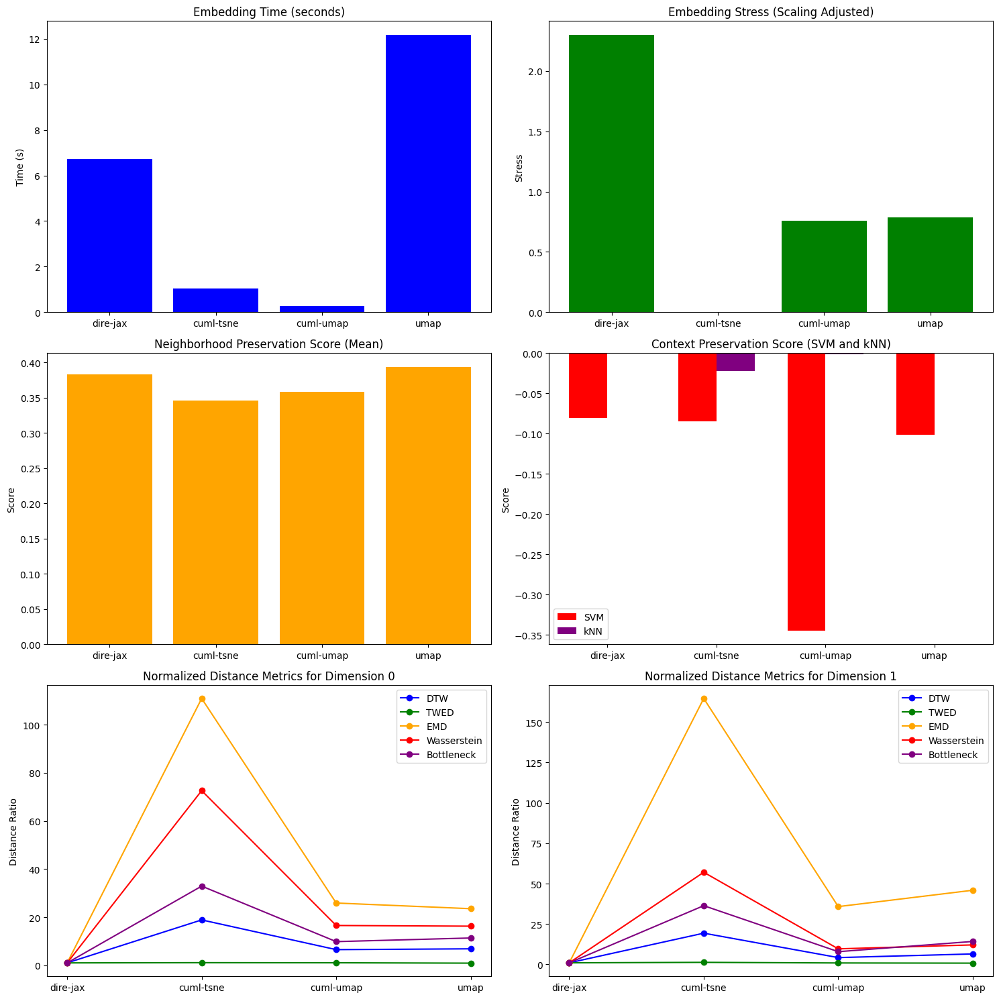

In [ ]:
plot_algorithm_comparison(benchmarks_moons)

## Dataset "Levine 13"

In [ ]:
exprs_l13 = DataLoader.load_dataset(dataset = "levine13", force_download=True)
exprs_l13.preprocess(arcsinh=True)
##
mask = exprs_l13.cell_types!= 'unassigned'
##
features_l13 = exprs_l13.expression_matrix[mask,:]
labels_l13   = exprs_l13.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [ ]:
reducer_l13 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=4,
                   verbose=False,)

100%|██████████| 64/64 [00:07<00:00,  8.71it/s]


Embedding time: 9.2491 seconds


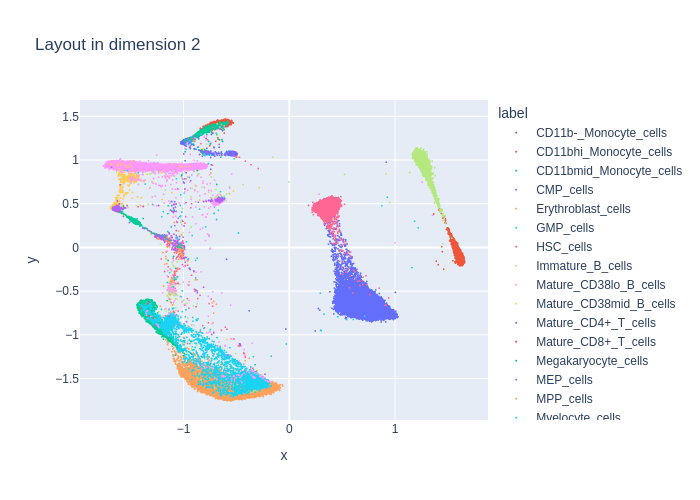

Computing persistence up to dimension 1 and global metrics
done


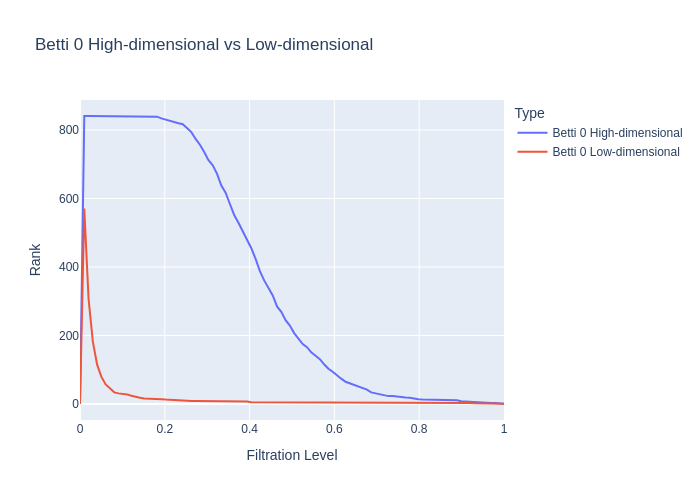

Distance `DTW` for dimension 0: 1.1235942276925843
Distance `TWED` for dimension 0: 0.18976500794127749
Distance `EMD` for dimension 0: 0.0019552511218141784
Distance `Wasserstein` for dimension 0: 0.1315816086440155
Distance `bottleneck` for dimension 0: 2.08062744140625


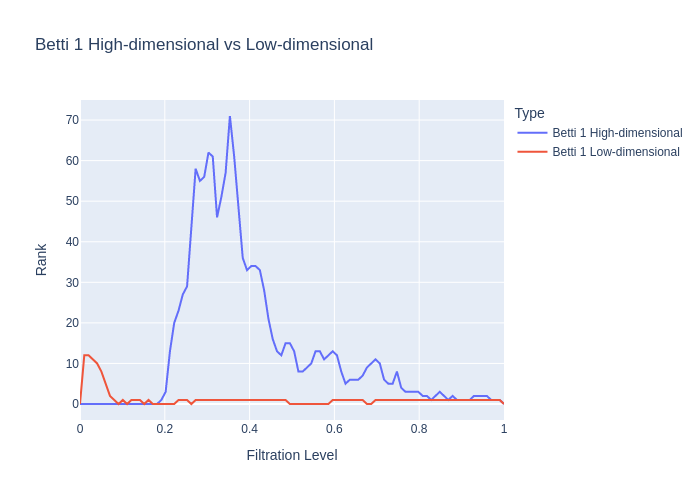

Distance `DTW` for dimension 1: 0.17734848489763205
Distance `TWED` for dimension 1: 0.04715112632593101
Distance `EMD` for dimension 1: 0.002573694000038563
Distance `Wasserstein` for dimension 1: 0.0074698650004358215
Distance `bottleneck` for dimension 1: 0.6960830688476562
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.120111069485987
Neighborhood preservation score (mean, std): [0.004532822407782078, 0.01125006377696991]
Computing context measures
done
Context preservation score (SVM): [0.9568579568579568, 0.8331298331298331, -0.13846546287877995]
Context preservation score (kNN): [0.946177370030581, 0.9361875637104995, -0.010614201241773428]


In [ ]:
viz_benchmark(reducer_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmarks_l13 = {}

In [ ]:
benchmark = run_benchmark(reducer_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:03<00:00, 16.78it/s]


### CuML tSNE reducer

[W] [01:01:25.870027] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 2.9198 seconds


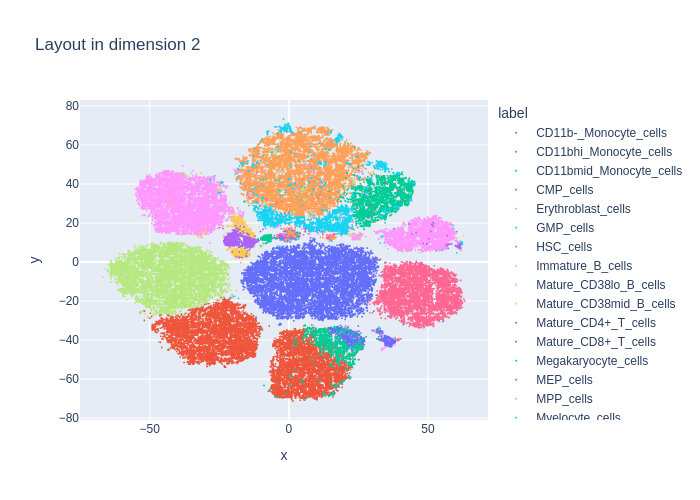

Computing persistence up to dimension 1 and global metrics
done


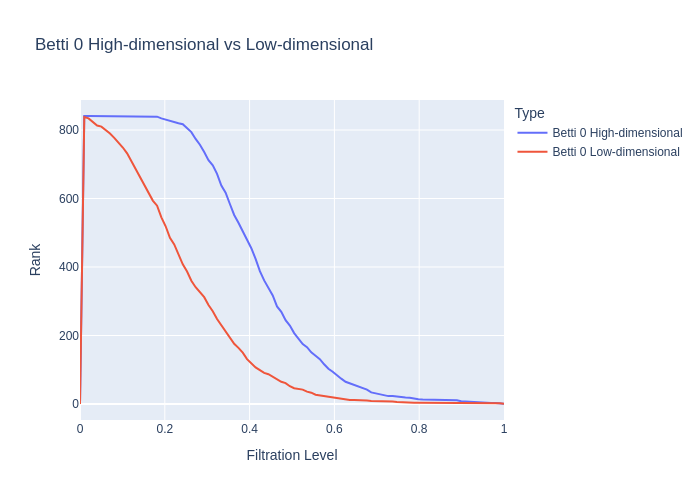

Distance `DTW` for dimension 0: 0.05578330370300339
Distance `TWED` for dimension 0: 0.07035090966975732
Distance `EMD` for dimension 0: 0.00010276586709938272
Distance `Wasserstein` for dimension 0: 0.06214458605989404
Distance `bottleneck` for dimension 0: 4.317622661590576


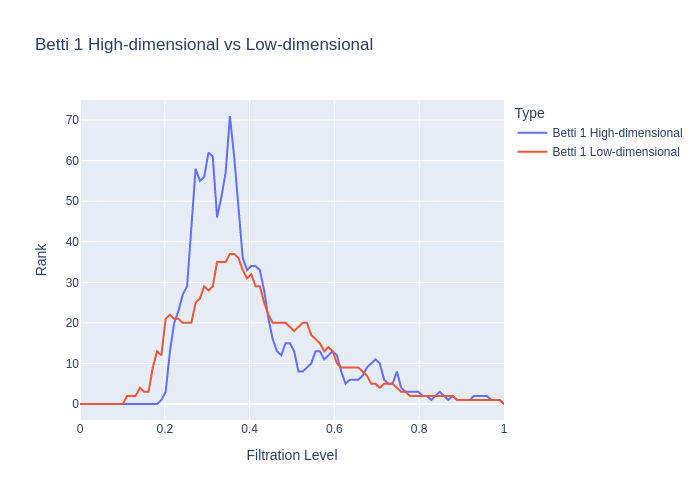

Distance `DTW` for dimension 1: 0.10156931930772559
Distance `TWED` for dimension 1: 0.03646684024796818
Distance `EMD` for dimension 1: 0.0006694264096289632
Distance `Wasserstein` for dimension 1: 0.021556106430011178
Distance `bottleneck` for dimension 1: 3.6467466354370117
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.918580685878317
Neighborhood preservation score (mean, std): [0.05120265483856201, 0.057410817593336105]
Computing context measures
done
Context preservation score (SVM): [0.9568579568579568, 0.7802197802197802, -0.20407930549442505]
Context preservation score (kNN): [0.9549439347604485, 0.9654638124362895, 0.01095598881987325]


In [ ]:
tred_l13 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [01:02:47.760281] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 3.0533 seconds


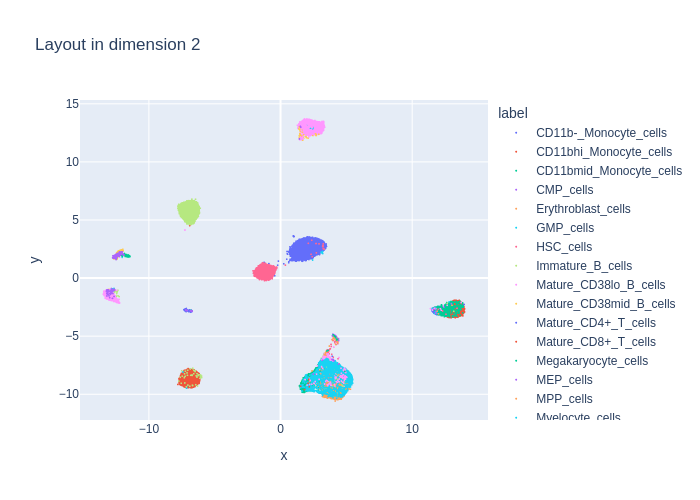

Computing persistence up to dimension 1 and global metrics
done


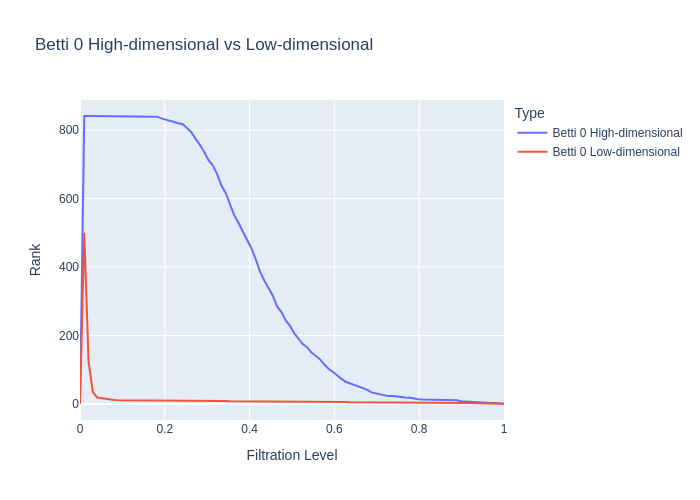

Distance `DTW` for dimension 0: 1.5262061768143347
Distance `TWED` for dimension 0: 0.2068532419728709
Distance `EMD` for dimension 0: 0.003724665128538673
Distance `Wasserstein` for dimension 0: 0.13608910146629782
Distance `bottleneck` for dimension 0: 4.218611717224121


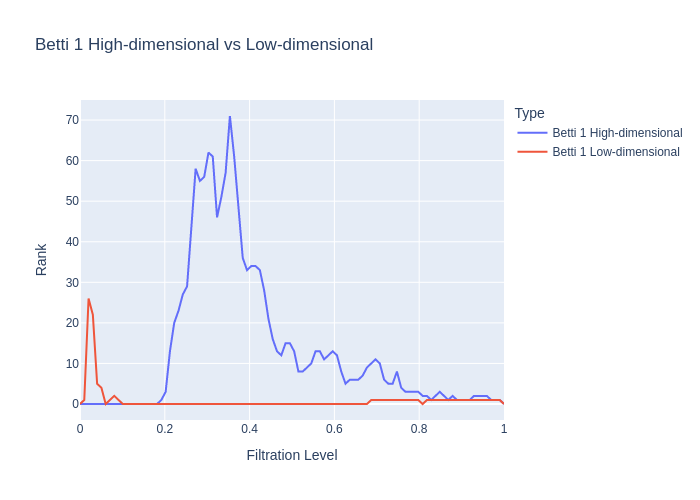

Distance `DTW` for dimension 1: 0.1013625082713831
Distance `TWED` for dimension 1: 0.04860699738629426
Distance `EMD` for dimension 1: 0.004573462046303399
Distance `Wasserstein` for dimension 1: 0.008173654499287666
Distance `bottleneck` for dimension 1: 0.8785619735717773
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.5731564319980484
Neighborhood preservation score (mean, std): [0.008338848128914833, 0.015737175941467285]
Computing context measures
done
Context preservation score (SVM): [0.9568579568579568, 0.7492877492877493, -0.24453186730699153]
Context preservation score (kNN): [0.946177370030581, 0.9499694189602447, 0.0039997472844461104]


In [ ]:
cured_l13 = cUMAP(n_components=reducer_l13.dimension,
                  n_neighbors=reducer_l13.n_neighbors,
                  min_dist=reducer_l13.min_dist,
                  spread=reducer_l13.spread)
#
viz_benchmark(cured_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 46.0163 seconds


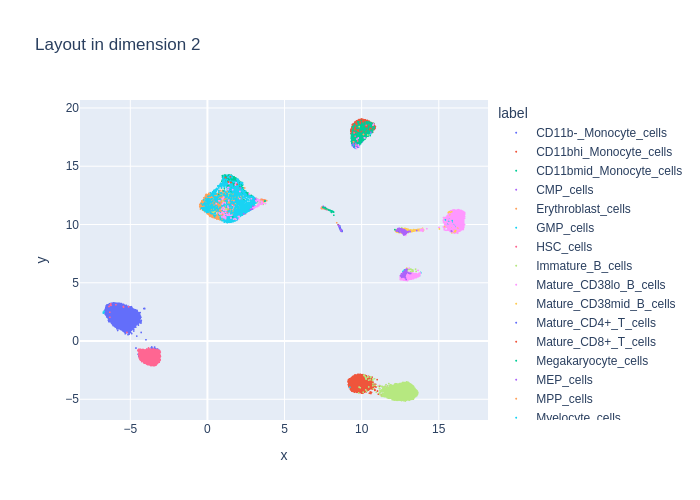

Computing persistence up to dimension 1 and global metrics
done


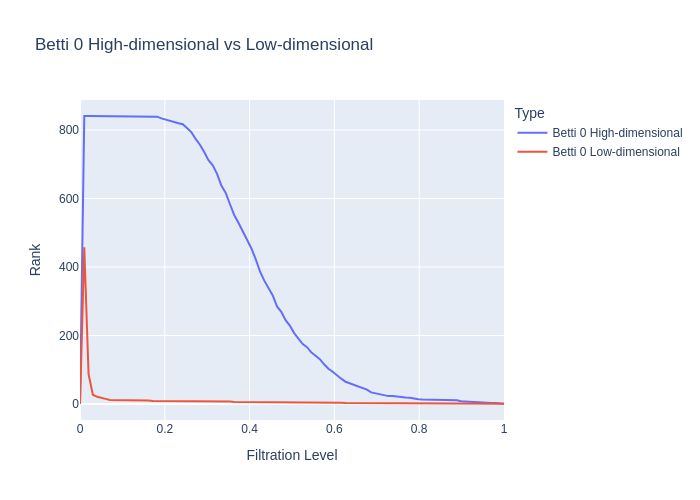

Distance `DTW` for dimension 0: 1.7332109648137421
Distance `TWED` for dimension 0: 0.20904712420825702
Distance `EMD` for dimension 0: 0.004536527570747789
Distance `Wasserstein` for dimension 0: 0.13564958486257023
Distance `bottleneck` for dimension 0: 4.566549301147461


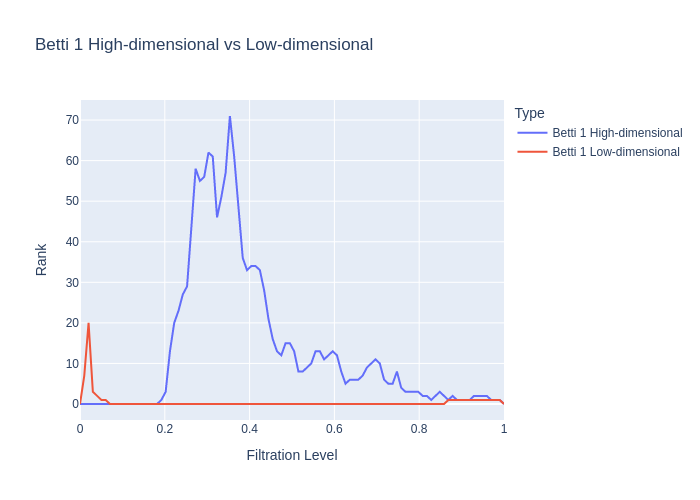

Distance `DTW` for dimension 1: 0.13251111531540596
Distance `TWED` for dimension 1: 0.04837799631195627
Distance `EMD` for dimension 1: 0.013884414958166176
Distance `Wasserstein` for dimension 1: 0.008101511479779508
Distance `bottleneck` for dimension 1: 1.0383262634277344
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 6.239696797558331
Neighborhood preservation score (mean, std): [0.009690118953585625, 0.017542235553264618]
Computing context measures
done
Context preservation score (SVM): [0.9568579568579568, 0.8217338217338217, -0.15223843022723202]
Context preservation score (kNN): [0.946177370030581, 0.9553924566768603, 0.009692159240156454]


In [ ]:
red_l13 = UMAP(n_components=reducer_l13.dimension,
               n_neighbors=reducer_l13.n_neighbors,
               min_dist=reducer_l13.min_dist,
               spread=reducer_l13.spread)
#
viz_benchmark(red_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

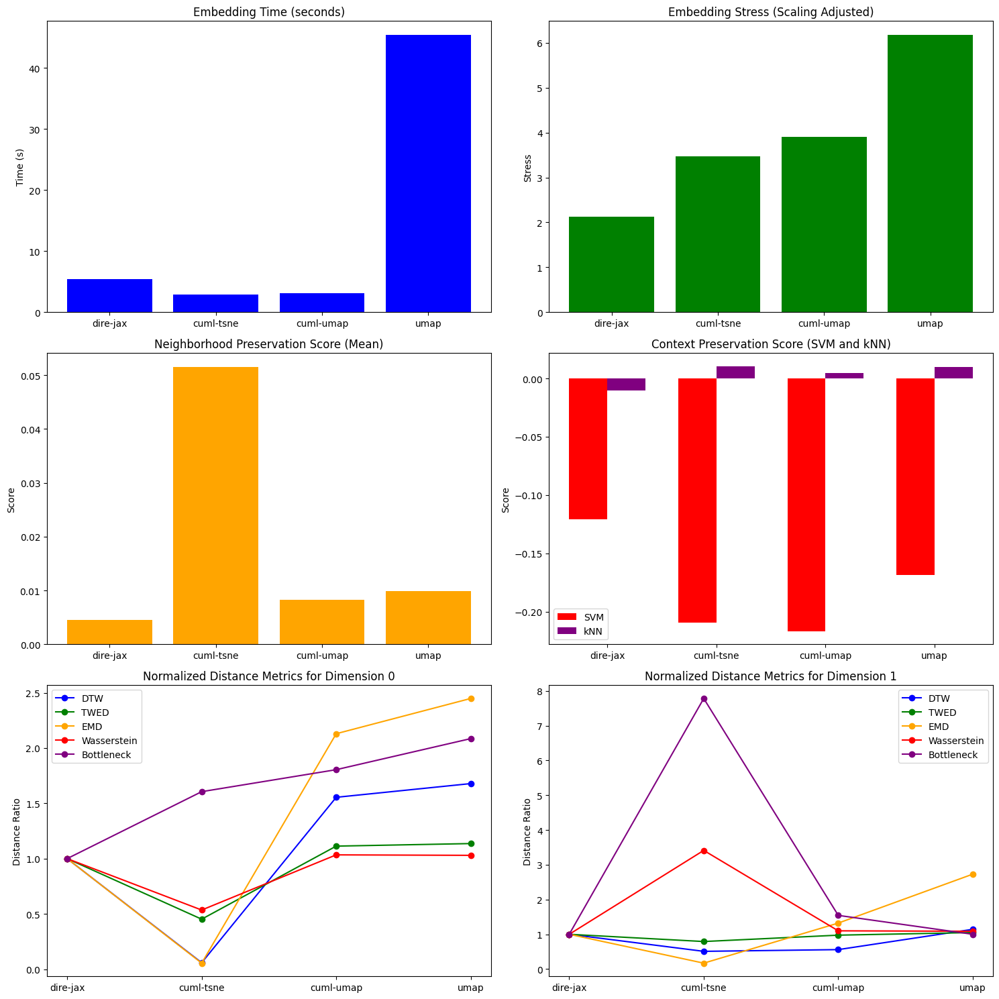

In [ ]:
plot_algorithm_comparison(benchmarks_l13)

## Dataset "Levine 32"

In [ ]:
exprs_l32 = DataLoader.load_dataset(dataset = "levine32", force_download=True)
exprs_l32.preprocess(arcsinh=True)
##
mask = exprs_l32.cell_types!= 'unassigned'
##
features_l32 = exprs_l32.expression_matrix[mask,:]
labels_l32   = exprs_l32.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [ ]:
reducer_l32 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='random',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=16,
                   verbose=False,)

100%|██████████| 64/64 [00:09<00:00,  6.95it/s]


Embedding time: 11.8532 seconds


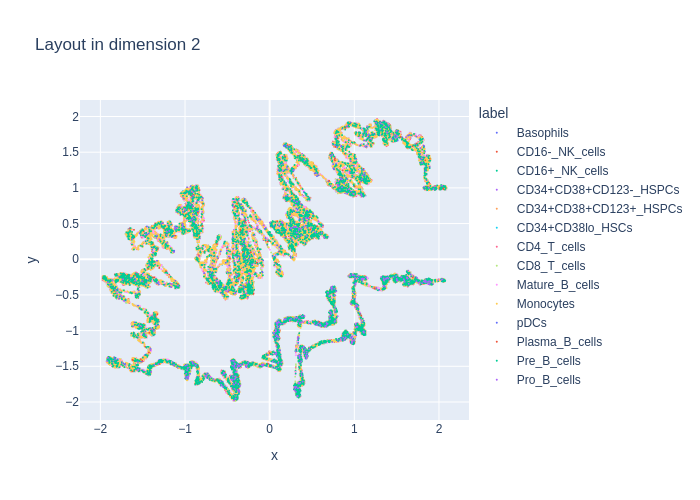

Computing persistence up to dimension 1 and global metrics
done


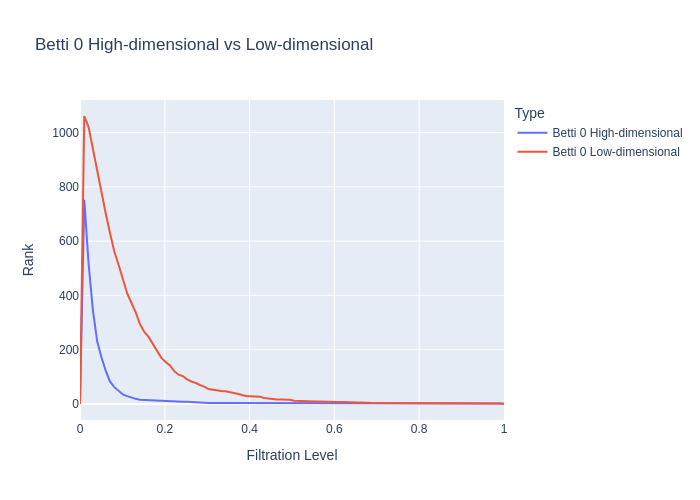

Distance `DTW` for dimension 0: 219.14950856979277
Distance `TWED` for dimension 0: 0.17956391531202287
Distance `EMD` for dimension 0: 1.793170423915323
Distance `Wasserstein` for dimension 0: 103.17265157985088
Distance `bottleneck` for dimension 0: 22957.16796875


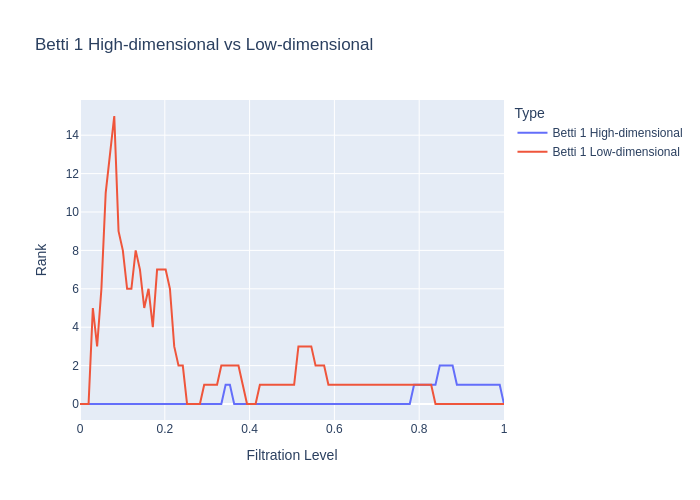

Distance `DTW` for dimension 1: 16.543942593753766
Distance `TWED` for dimension 1: 0.022318262944229235
Distance `EMD` for dimension 1: 2.2065130548156375
Distance `Wasserstein` for dimension 1: 0.06637402051857542
Distance `bottleneck` for dimension 1: 380.2877197265625
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.1898320770235067
Neighborhood preservation score (mean, std): [0.04323725402355194, 0.05982039123773575]
Computing context measures
done
Context preservation score (SVM): [0.9831424936386769, 0.258587786259542, -1.3355188325843057]
Context preservation score (kNN): [0.9750127975428717, 0.23630662912720757, -1.4173203589369638]


In [ ]:
viz_benchmark(reducer_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2,)

In [ ]:
benchmarks_l32 = {}

In [ ]:
benchmark = run_benchmark(reducer_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:05<00:00, 11.82it/s]


### CuML tSNE reducer

[W] [01:16:26.164167] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 3.7997 seconds


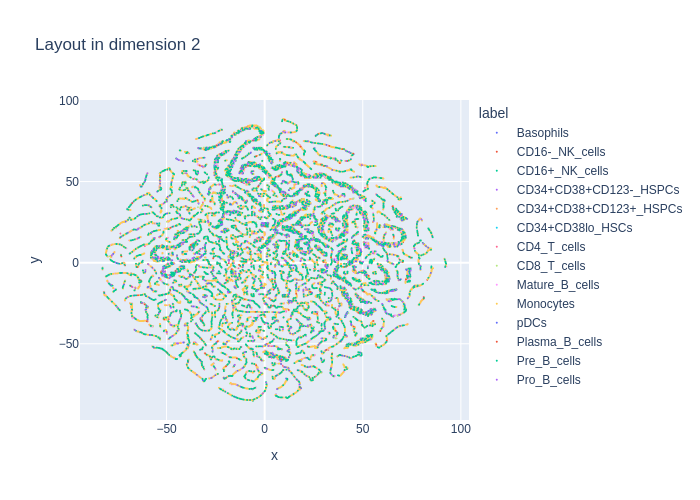

Computing persistence up to dimension 1 and global metrics
done


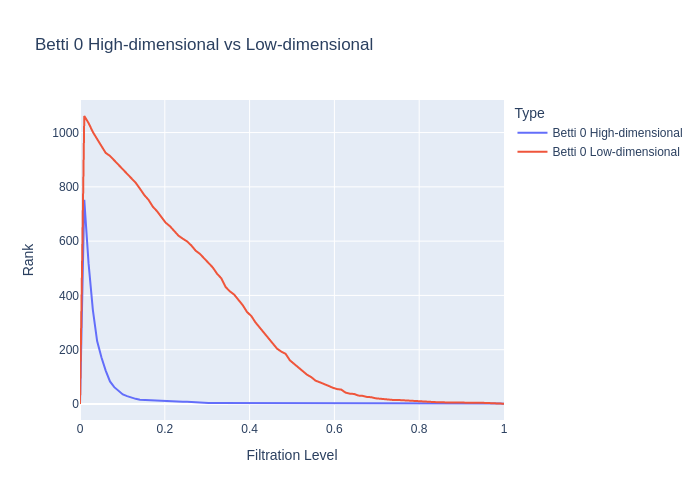

Distance `DTW` for dimension 0: 219.19814678285638
Distance `TWED` for dimension 0: 0.198954293445522
Distance `EMD` for dimension 0: 4.624792389335311
Distance `Wasserstein` for dimension 0: 103.36991670615186
Distance `bottleneck` for dimension 0: 22957.16796875


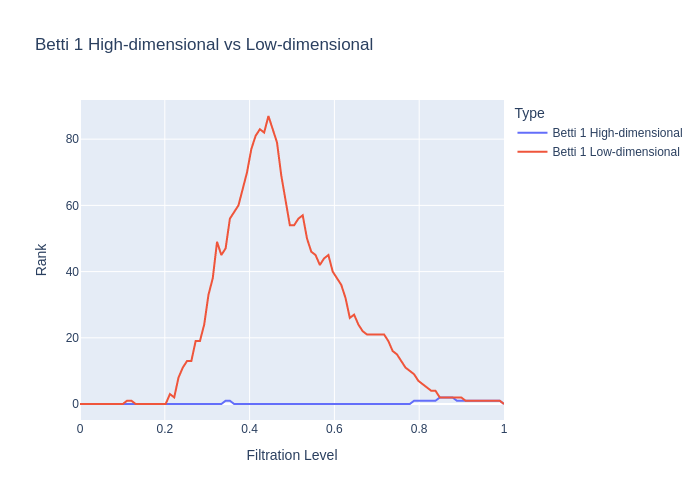

Distance `DTW` for dimension 1: 16.470990606310856
Distance `TWED` for dimension 1: 0.036275166707112144
Distance `EMD` for dimension 1: 23.97157756769671
Distance `Wasserstein` for dimension 1: 0.09175176375001487
Distance `bottleneck` for dimension 1: 380.2877197265625
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.965779975353313
Neighborhood preservation score (mean, std): [0.22013109922409058, 0.1709945797920227]
Computing context measures
done
Context preservation score (SVM): [0.9831424936386769, 0.258587786259542, -1.3355188325843057]
Context preservation score (kNN): [0.9774763245456872, 0.23377911441003327, -1.4305973571141344]


In [ ]:
tred_l32 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(tred_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [01:18:10.763095] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 3.8772 seconds


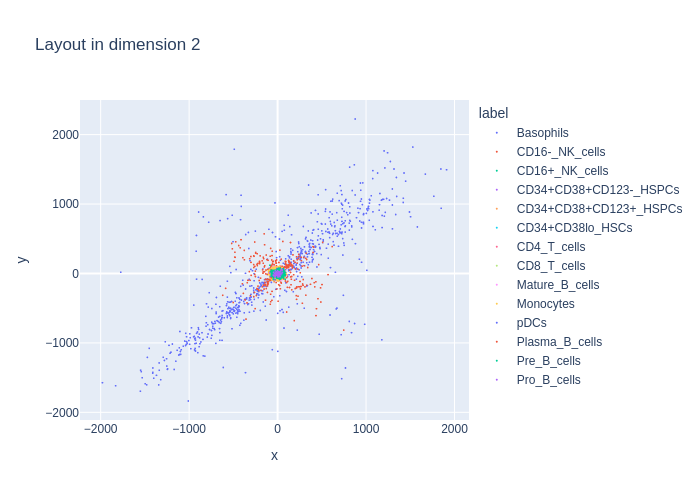

Computing persistence up to dimension 1 and global metrics
done


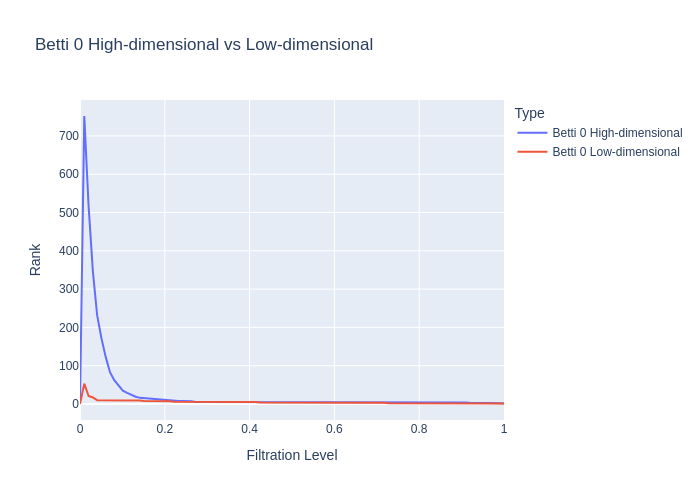

Distance `DTW` for dimension 0: 214.89903397589487
Distance `TWED` for dimension 0: 0.1644194615980473
Distance `EMD` for dimension 0: 2.359138189698663
Distance `Wasserstein` for dimension 0: 103.05222350632452
Distance `bottleneck` for dimension 0: 22957.16796875


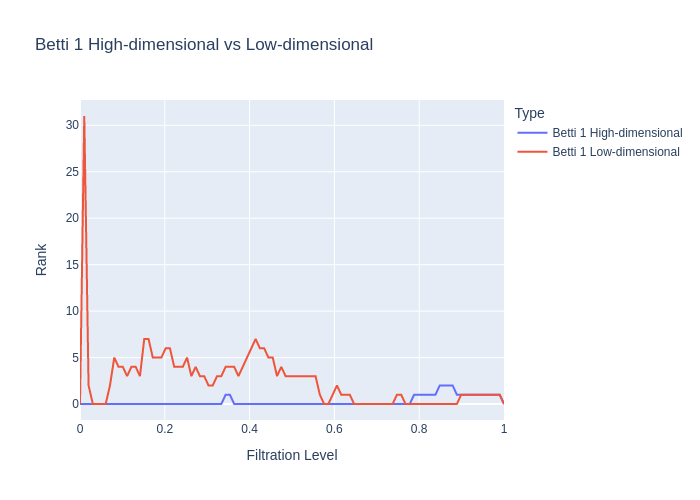

Distance `DTW` for dimension 1: 16.341190494352933
Distance `TWED` for dimension 1: 0.02701437042146048
Distance `EMD` for dimension 1: 2.6008280047740437
Distance `Wasserstein` for dimension 1: 0.0726376555286667
Distance `bottleneck` for dimension 1: 380.2877197265625
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 27.751228230112194
Neighborhood preservation score (mean, std): [0.0007132795872166753, 0.006829546298831701]
Computing context measures
done
Context preservation score (SVM): [0.9831424936386769, 0.26017811704834604, -1.3293876055293694]
Context preservation score (kNN): [0.9750127975428717, 0.326657281801894, -1.093539043190761]


In [ ]:
cured_l32 = cUMAP(n_components=reducer_l32.dimension,
                  n_neighbors=reducer_l32.n_neighbors,
                  min_dist=reducer_l32.min_dist,
                  spread=reducer_l32.spread)
#
viz_benchmark(cured_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(cured_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 45.6763 seconds


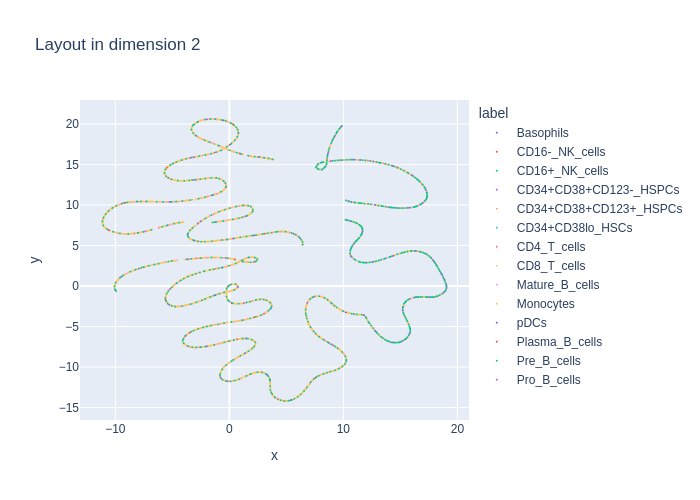

Computing persistence up to dimension 1 and global metrics
done


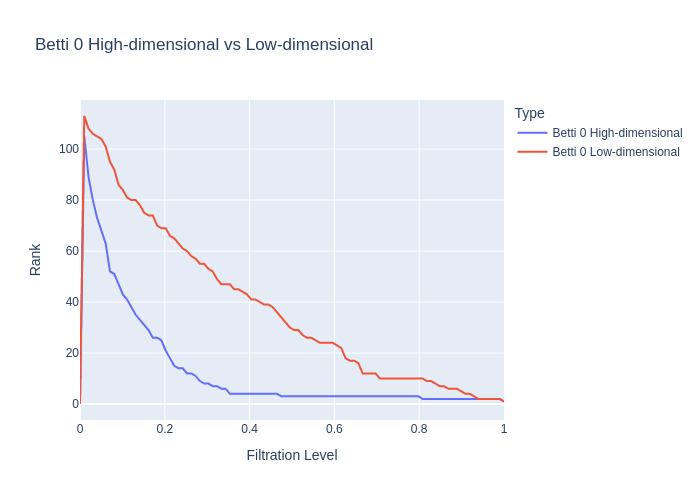

Distance `DTW` for dimension 0: 4918.520907641536
Distance `TWED` for dimension 0: 0.4720817665001015
Distance `EMD` for dimension 0: 50.38546821746399
Distance `Wasserstein` for dimension 0: 892.8572710916524
Distance `bottleneck` for dimension 0: 53023.9765625


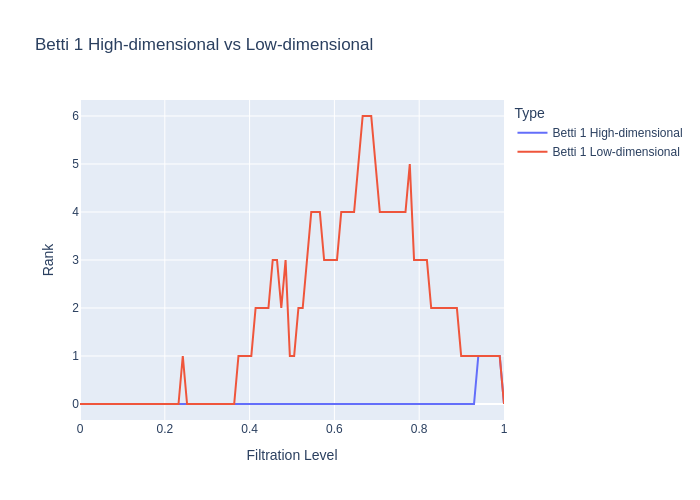

Distance `DTW` for dimension 1: 1224.8005809471451
Distance `TWED` for dimension 1: 0.22782715353319952
Distance `EMD` for dimension 1: 669.5960882210397
Distance `Wasserstein` for dimension 1: 1.1445753485024979
Distance `bottleneck` for dimension 1: 865.373046875
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 8.513398271683027
Neighborhood preservation score (mean, std): [0.42084431648254395, 0.28765198588371277]
Computing context measures
done
Context preservation score (SVM): [0.9814814814814815, 0.23148148148148148, -1.4445632692438664]
Context preservation score (kNN): [0.9526551503518874, 0.22776711452335252, -1.4309293018319786]


In [ ]:
features_l32_sub = features_l32[::10]
labels_l32_sub   = labels_l32[::10]
#
red_l32 = UMAP(n_components=reducer_l32.dimension,
               n_neighbors=reducer_l32.n_neighbors,
               min_dist=reducer_l32.min_dist,
               spread=reducer_l32.spread)
#
viz_benchmark(red_l32,
              features_l32_sub,
              labels=labels_l32_sub,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [ ]:
benchmark = run_benchmark(red_l32,
                          features_l32_sub,
                          labels=labels_l32_sub,
                          dimension=1,
                          subsample_threshold=0.3,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

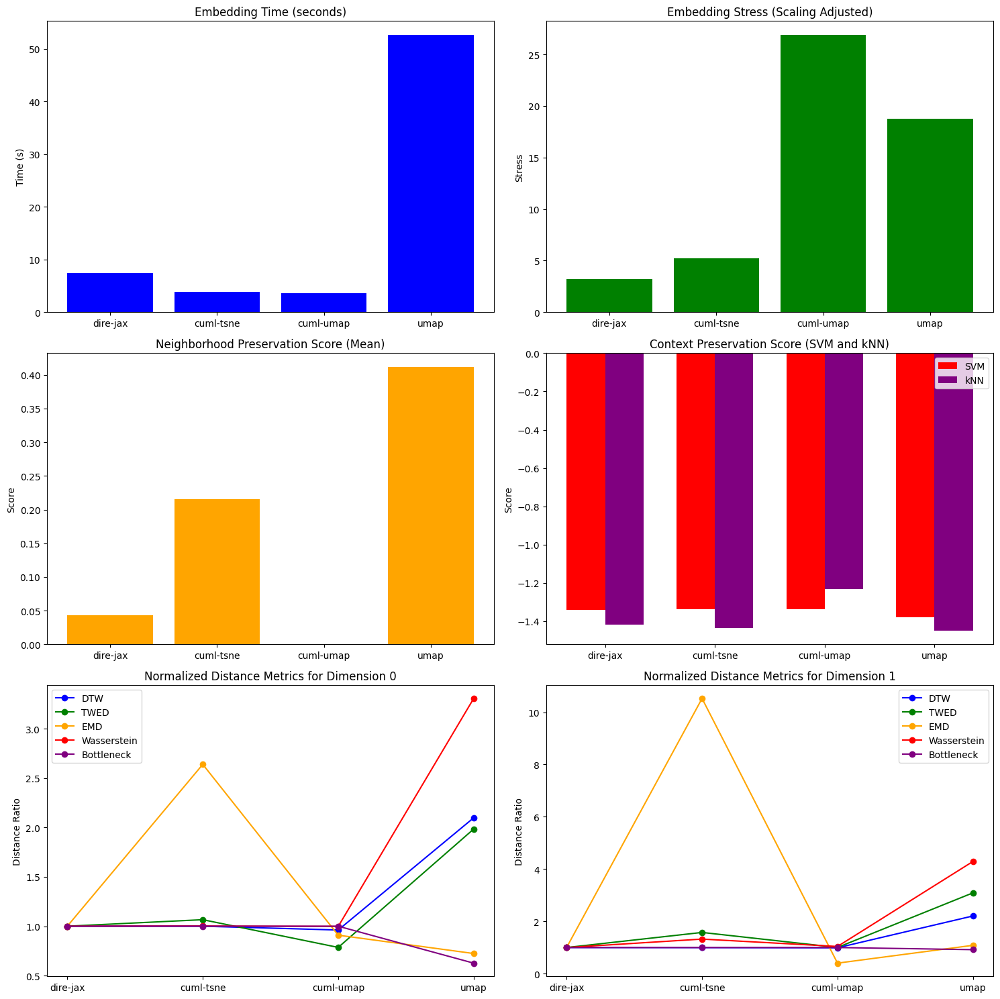

In [ ]:
plot_algorithm_comparison(benchmarks_l32)